---
# **Background Fit Demo**
---

This script runs through the main() function from do_bkg_estimation_wPSs_mp2.py using event data from the Example_LLH_setup_fixed_dirs.ipynb notebook. In the aforementioned notebook, the completed background fit is read in from a .csv file, bypassing the need to run the background estimation process. Here, we go through the background fitting process and show step-by-step how the background fitting process functions.

Starting first with the necessary imports copied from the notebook.

In [1]:
import numpy as np
from astropy.io import fits # FITS -> Flexible Image Transport System.
from astropy.table import Table, vstack # astropy.table provides functionality
                                        # for storing and manipulating 
                                        # tables of data familiar to numpy users.
                                        # Table is the generic object for 
                                        # creating tables and vstack is a function
                                        # for stacking multiple tables vertically 
                                        # along rows.
from astropy.wcs import WCS # WCS -> World Coordinate System. The library 
                            # contains utilities for managing WCS 
                            # transformations defined in FITS WCS standard 
                            # conventions.
import os
import argparse
import logging, traceback   # logging odule defines functions and classes which
                            # implement a flexible even logging system for 
                            # applications and libraries. traceback provides 
                            # inverface to extract, format and print stack
                            # traces of python programs.
import pandas as pd
from copy import copy, deepcopy # for compound objects (objects that contain 
                            # other objects) a shallow copy constructs a new 
                            # compound object and then inserts references into
                            # it to the objects found in the original. The 
                            # function copy performs a shallow copy. deepcopy
                            # performs a deep copy which constructs a new 
                            # compound object and then, recursively, inserts 
                            # copies into it of the objects found in the original.
import multiprocessing as mp # This library allows the programmer to fully
                             # leverage multiple processors on a given machine.
import matplotlib.pyplot as plt


In [2]:
# Change directory to the same directory as do_bkg_estimation_wPSs_mp2.py
os.getcwd()
os.chdir('/Volumes/WD/Development/Programming/NITRATES_RESP_DIR_PIP/')
print(os.getcwd())

/Volumes/WD/Development/Programming/NITRATES_RESP_DIR_PIP


In [3]:
from nitrates.analysis_seeds.bkg_rate_estimation import get_avg_lin_cub_rate_quad_obs
from nitrates.config import quad_dicts, EBINS0, EBINS1,\
                solid_angle_dpi_fname, bright_source_table_fname
from nitrates.lib.sqlite_funcs import write_rate_fits_from_obj, get_conn
from nitrates.lib.dbread_funcs import get_info_tab, guess_dbfname, get_files_tab
from nitrates.lib.event2dpi_funcs import filter_evdata
from nitrates.models.models import Bkg_Model_wFlatA, CompoundModel, Point_Source_Model_Binned_Rates
from nitrates.llh_analysis.LLH import LLH_webins
from nitrates.llh_analysis.minimizers import NLLH_ScipyMinimize, NLLH_ScipyMinimize_Wjacob
from nitrates.response.ray_trace_funcs import RayTraces
from nitrates.lib.coord_conv_funcs import convert_radec2imxy
from nitrates.lib.gti_funcs import add_bti2gti, bti2gti, gti2bti, union_gtis
from nitrates.lib.wcs_funcs import world2val
import nitrates

Could not get the $HEADAS system variable. Please ensure that this is set and points to the HEASOFT directory.
Could not get the $CALDB system variable. Please ensure that this is set and points to the CALDB directory.
No module named 'ROOT'
Please install the Python ROOT package to be able to run the full forward modeling calculations.
16
16
[array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]), array([19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]), array([37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]), array([55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]), array([73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]), array([ 91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104]), array([109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121,
       122]), array([127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139,
       140]), array([145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157,

Here, we are copying the functions that are defined within do_bkg_estimation_wPSs_mp2.py and utilized within its main() function.

In [4]:

def ang_sep(ra0, dec0, ra1, dec1):

    dcos = np.cos(np.radians(np.abs(ra0 - ra1)))
    angsep = np.arccos(np.cos(np.radians(90-dec0))*np.cos(np.radians(90-dec1)) +\
                        np.sin(np.radians(90-dec0))*np.sin(np.radians(90-dec1))*dcos)
    return np.rad2deg(angsep)

def im_dist(imx0, imy0, imx1, imy1):
    return np.hypot((imx1 - imx0), (imy1 - imy0))

def add_imxy2src_tab(src_tab, attfile, t0):

    att_ind = np.argmin(np.abs(attfile['TIME'] - t0))
    att_quat = attfile['QPARAM'][att_ind]
    pnt_ra, pnt_dec = attfile['POINTING'][att_ind,:2]
    imxs = np.zeros(len(src_tab))
    imys = np.zeros(len(src_tab))
    src_tab['PntSep'] = ang_sep(pnt_ra, pnt_dec, src_tab['RAJ2000'], src_tab['DEJ2000'])
    for i in range(len(imxs)):
        if src_tab['PntSep'][i] > 80.0:
            imxs[i], imys[i] = np.nan, np.nan
            continue
        imxs[i], imys[i] = convert_radec2imxy(src_tab['RAJ2000'][i],\
                                              src_tab['DEJ2000'][i],\
                                              att_quat)
    src_tab['imx'] = imxs
    src_tab['imy'] = imys
    return src_tab

def get_srcs_infov(attfile, t0, pcfname=None, pcmin=5e-2):

    brt_src_tab = Table.read(bright_source_table_fname)
    add_imxy2src_tab(brt_src_tab, attfile, t0)
    bl_infov = (np.abs(brt_src_tab['imy'])<.95)&(np.abs(brt_src_tab['imx'])<1.75)
    if pcfname is not None:
        try:
            PC = fits.open(pcfname)[0]
            pc = PC.data
            w_t = WCS(PC.header, key='T')
            pcvals = world2val(w_t, pc, brt_src_tab['imx'],\
                                brt_src_tab['imy'])
            bl_infov = bl_infov&(pcvals>=pcmin)
        except Exception as E:
            logging.warn("Trouble Using PC file")
            logging.error(E)
    N_infov = np.sum(bl_infov)
    return brt_src_tab[bl_infov]


def min_by_ebin(miner, params_):

    nebins = miner.llh_obj.nebins
    params = copy(params_)
    bf_params = copy(params_)
    NLLH = 0.0

    for e0 in range(nebins):
        miner.set_fixed_params(list(params.keys()), values=list(params.values()))
        e0_pnames = []
        for pname in miner.param_names:
            try:
                if int(pname[-1])==e0:
                    e0_pnames.append(pname)
            except:
                pass
        miner.set_fixed_params(e0_pnames, fixed=False)
        miner.llh_obj.set_ebin(e0)

        bf_vals, nllh, res = miner.minimize()
        NLLH += nllh[0]
        for ii, pname in enumerate(e0_pnames):
            bf_params[pname] = bf_vals[0][ii]

    return NLLH, bf_params

class Worker(mp.Process):

    def __init__(self, result_queue, miner, param_list):

        mp.Process.__init__(self)
        self.miner = miner
        self.param_list = param_list
        self.result_queue = result_queue

    def run(self):
        proc_name = self.name

        for params in self.param_list:

            nllh, bf_params = min_by_ebin(self.miner, params)
            res_dict = bf_params
            res_dict['nllh'] = nllh
            self.result_queue.put(res_dict)


        self.result_queue.put(None)
        return


def bkg_withPS_fit(PS_tab, model, llh_obj, t0s, t1s,\
                   dimxy=2e-3, im_steps=5, test_null=False,\
                   Nprocs=1):

    # Create a linear space between -2e-3 and 2e-3 with im_step steps
    # For special cases where im_steps is either 1, 2, or 3, We set up 
    # our imax (and imax0 and imax1) differently.
    Nps = len(PS_tab)
    imax = np.linspace(-dimxy, dimxy, im_steps)
    if im_steps == 3:
        imax = np.linspace(-dimxy/2., dimxy/2., im_steps)
    elif im_steps == 2:
        imax = np.linspace(-dimxy/2., dimxy/2., im_steps)
        imax0 = [-dimxy, 0.0, dimxy]
        imax1 = [dimxy, 0.0, -dimxy]
    elif im_steps == 1:
        imax = np.array([0.0])

    # For each of the point sources, we create a list of [imax, imax]
    # lists (i.e. a list of lists representing two linear spaces)
    imlist = []
    for i in range(Nps):
        if im_steps == 2:
            imlist += [imax0,imax1]
        else:
            imlist += [imax,imax]
    # Create a coordinate grid of [imax, imax] coordinates??
    imgs = np.meshgrid(*imlist)
    Npnts = imgs[0].size
    if im_steps == 2:
        ind_grids = np.meshgrid(*(np.arange(3, dtype=np.int) for i in range(Nps)))
        Npnts = ind_grids[0].size
    logging.info("Npnts: %d"%(Npnts))

    # Set up the background minimizer and likelihood object with time set with
    # t0s and t1s as provided in the function call
    bkg_miner = NLLH_ScipyMinimize_Wjacob('')
    bkg_miner.set_llh(llh_obj)
    llh_obj.set_time(t0s,t1s)

    bf_params_list = []
    bkg_nllhs = np.zeros(Npnts)

    nebins = model.nebins
    param_list = []

    # iterating over each array within the meshgrid
    for i in range(Npnts):
        bf_params = {}
        im_names = []
        params_ = {pname:val['val'] for pname, val in bkg_miner.param_info_dict.items()}

        # Iterating over each number of point sources and accumulating their
        # respective parameters from the 
        for j in range(Nps):
            row = PS_tab[j]
            psname = row['Name']
            if im_steps == 2:
                params_[psname+'_imx'] = imlist[2*j][ind_grids[j].ravel()[i]] + row['imx']
                params_[psname+'_imy'] = imlist[2*j+1][ind_grids[j].ravel()[i]] + row['imy']
            else:
                params_[psname+'_imx'] = imgs[2*j].ravel()[i] + row['imx']
                params_[psname+'_imy'] = imgs[2*j+1].ravel()[i] + row['imy']
            im_names = [psname+'_imx', psname+'_imy']
#         im_vals = [bf_params[nm] for nm in im_names]
        if Nprocs > 1:
            param_list.append(params_)
            continue
        im_vals = [params_[nm] for nm in im_names]

        bkg_nllhs[i], bf_params = min_by_ebin(bkg_miner, params_)

        bf_params_list.append(bf_params)

    if Nprocs > 1:

        res_q = mp.Queue()
        workers = []
        Nper_worker = 1 + int(len(param_list)/(1.*Nprocs))
        logging.info("Nper_worker: %d"%(Nper_worker))
        for i in range(Nprocs):
            i0 = i*Nper_worker
            i1 = i0 + Nper_worker
            w = Worker(res_q, deepcopy(bkg_miner), param_list[i0:i1])
            workers.append(w)

        for w in workers:
            w.start()
        res_dicts = []
        Ndone = 0
        while True:
            res = res_q.get()
            if res is None:
                Ndone += 1
                logging.info("%d of %d done"%(Ndone, Nprocs))
                if Ndone >= Nprocs:
                    break
            else:
                res_dicts.append(res)
        for w in workers:
            w.join()

        df = pd.DataFrame(res_dicts)
        min_ind = np.argmin(df['nllh'])
        bf_df_row = df.iloc[min_ind]
        bf_nllh = bf_df_row['nllh']
        bf_params = {name:bf_df_row[name] for name in bf_df_row.index if\
                         not 'nllh' in name}


    else:
        bf_ind = np.argmin(bkg_nllhs)
        bf_params = bf_params_list[bf_ind]
        bf_nllh = bkg_nllhs[bf_ind]

    # If prompted by test_null=True, we calculate the test statistic when
    # the rate parameters for each of the point sources are set to
    if test_null:
        TS_nulls = {}
        for i in range(Nps):
            params_ = copy(bf_params)
            row = PS_tab[i]
            psname = row['Name']
            for j in range(nebins):
                params_[psname+'_rate_'+str(j)] = 0.0
            llh_obj.set_ebin(-1)
            nllh_null = -llh_obj.get_logprob(params_)
            TS_nulls[psname] = np.sqrt(2.*(nllh_null - bf_nllh))
            if np.isnan(TS_nulls[psname]):
                TS_nulls[psname] = 0.0
        return bf_nllh, bf_params, TS_nulls


    return bf_nllh, bf_params



def do_init_bkg_wPSs(bkg_mod, llh_obj, src_tab, rt_obj, GTI, sig_twind,\
                    TSmin=7.0, Nprocs=1, tmin=None, tmax=None):

    if not tmin is None:
        bti = (-np.inf, tmin)
        GTI = add_bti2gti(bti, GTI)
    if not tmax is None:
        bti = (tmax, np.inf)
        GTI = add_bti2gti(bti, GTI)
    gti_bkg = add_bti2gti(sig_twind, GTI)
    bkg_t0s = gti_bkg['START']
    bkg_t1s = gti_bkg['STOP']
    exp = 0.0
    for i in range(len(bkg_t0s)):
        exp += (bkg_t1s[i] - bkg_t0s[i])
    logging.info("exp: %.3f"%(exp))
    # if exp < 30.0:
    #     logging.info("Trying to expand sig_twind")
    #     sig_twind = (sig_twind[0] + 20.0, sig_twind[1] - 20.0)
    #     gti_bkg = add_bti2gti(sig_twind, GTI_)
    #     bkg_t0s = gti_bkg['START']
    #     bkg_t1s = gti_bkg['STOP']
    #     exp = 0.0
    #     for i in range(len(bkg_t0s)):
    #         exp += (bkg_t1s[i] - bkg_t0s[i])
    #     logging.info("exp: %.3f"%(exp))

    logging.info("bkg_t0s: ")
    logging.info(bkg_t0s)
    logging.info("bkg_t1s: ")
    logging.info(bkg_t1s)


    Nsrcs = len(src_tab)
    nebins = bkg_mod.nebins

    for ii in range(Nsrcs):
        mod_list = [bkg_mod]
        im_steps = 5
        TSmin_ = TSmin
        if Nsrcs >= 3:
            im_steps = 3
            TSmin_ = TSmin - 1.0
        if Nsrcs >= 5:
            im_steps = 2
            TSmin_ = TSmin - 1.5
        if Nsrcs >= 9:
            im_steps = 1
            TSmin_ = TSmin - 2.5

        ps_mods = []
        for i in range(Nsrcs):
            row = src_tab[i]
            mod = Point_Source_Model_Binned_Rates(row['imx'], row['imy'], 0.1,\
                                                  [llh_obj.ebins0,llh_obj.ebins1],\
                                                  rt_obj, llh_obj.bl_dmask,\
                                                  use_deriv=True, name=row['Name'])
            ps_mods.append(mod)

        mod_list += ps_mods
        comp_mod = CompoundModel(mod_list)

        llh_obj.set_model(comp_mod)

        bf_nllh, bf_params, TS_nulls = bkg_withPS_fit(src_tab, comp_mod,\
                                      llh_obj, bkg_t0s, bkg_t1s,\
                                      test_null=True, im_steps=im_steps,\
                                        Nprocs=Nprocs)

        logging.debug("TS_nulls: ")
        logging.debug(TS_nulls)

        bkg_rates = np.array([bf_params['Background'+'_bkg_rate_'+str(j)]\
                            for j in range(nebins)])
        min_rate = 1e-1*bkg_rates
        logging.debug("min_rate: ")
        logging.debug(min_rate)
        PSs2keep = []

        # Going through all of the point sources and checking that the if the 
        # test statistic is below our minimum rate, we exclude the point source 
        # from the background
        for name, TS in TS_nulls.items():
            ps_rates = np.array([bf_params[name+'_rate_'+str(j)] for j in range(nebins)])
            logging.debug(name + " rates: ")
            logging.debug(ps_rates)
            if TS < TSmin_:
                # ps_rates = np.array([bf_params[name+'_rate_'+str(j)] for j in range(nebins)])
                # print ps_rates
                if np.all(ps_rates<min_rate):
                    continue
            if np.all(ps_rates<(min_rate/20.)):
                continue
            PSs2keep.append(name)

        # errs_dict = {}
        # corrs_dict = {}
        # for e0 in range(nebins):
        #     flat_pname = 'Background_flat_'+str(e0)
        #     comp_mod.param_dict[flat_pname]['fixed'] = True
        #     comp_mod.param_dict[flat_pname]['val'] = bf_params[flat_pname]
        #     err_dict, corr_dict = get_errs_corrs(llh_obj, comp_mod, copy(bf_params),\
        #                                          e0, pnames2skip=[flat_pname])
        #     for k, val in err_dict.iteritems():
        #         errs_dict[k] = val
        #     for k, val in corr_dict.iteritems():
        #         corrs_dict[k] = val


        if len(PSs2keep) == len(src_tab):
            break
        if len(PSs2keep) == 0:
            Nsrcs = 0
            src_tab = src_tab[np.zeros(len(src_tab), dtype=np.bool)]
            break
        bl = np.array([src_tab['Name'][i] in PSs2keep for i in range(Nsrcs)])
        src_tab = src_tab[bl]
        Nsrcs = len(src_tab)
        logging.debug("src_tab: ")
        logging.debug(src_tab)

    return bf_params, src_tab#, errs_dict, corrs_dict



def get_info_mat_around_min(llh_obj, mod, params_, ebin):

    params = copy(params_)
    dt = llh_obj.dt
    mod_cnts = llh_obj.model.get_rate_dpi(params, ebin)*dt
    data_cnts = llh_obj.data_dpis[ebin]

    dR_dparams = mod.get_dr_dp(params, ebin)

    cov_ndim = len(dR_dparams)

    info_mat = np.zeros((cov_ndim,cov_ndim))

    for i in range(cov_ndim):
        for j in range(cov_ndim):
            info_mat[i,j] = np.sum(((dR_dparams[j]*dt)*(dR_dparams[i]*dt)*\
                                    data_cnts)/np.square(mod_cnts))
#             cov_mat[i,j] = np.sum(np.square(mod_cnts)/\
#                         ((dR_dparams[j]*dt)*(dR_dparams[i]*dt)*data_cnts))

    return info_mat


def get_errs_corrs(llh_obj, model, params, e0, pnames2skip=[]):

    imat = get_info_mat_around_min(llh_obj, model, copy(params), e0)
    cov_mat = np.linalg.inv(imat)
    e0_pnames = []
    for pname in model.param_names:
        try:
            if int(pname[-1])==e0 and not (pname in pnames2skip):
                e0_pnames.append(pname)
        except:
            pass

    err_dict = {}
    corr_dict = {}
    errs = np.sqrt(np.diag(cov_mat))
    for i, pname in enumerate(e0_pnames):
        k = 'err_' + pname
        err_dict[k] = errs[i]
    Npars = len(e0_pnames)
    for i in range(Npars-1):
        pname0 = e0_pnames[i]
        for j in range(i+1,Npars):
            pname1 = e0_pnames[j]
            k = 'corr_' + pname0 + '_' + pname1
            corr_dict[k] = cov_mat[i,j]/(errs[i]*errs[j])

    return err_dict, corr_dict


def bkg_withPS_fit_fiximxy(PS_tab, model, llh_obj, t0s, t1s, params_,\
                           fixed_pnames=None):

    Nps = len(PS_tab)
    params = copy(params_)

    llh_obj.set_model(model)
    bkg_miner = NLLH_ScipyMinimize_Wjacob('')
    bkg_miner.set_llh(llh_obj)
    llh_obj.set_time(t0s,t1s)

    nllh = 0.0
#     bf_params = {fixed_pars[i]:fixed_vals[i] for i in range(len(fixed_pars))}
    bf_params = copy(params)
    fixed_vals = [bf_params[pname] for pname in fixed_pnames]
    errs_dict = {}
    corrs_dict = {}

    # For each energy bin 
    for e0 in range(llh_obj.nebins):
        bkg_miner.set_fixed_params(bkg_miner.param_names)
        if fixed_pnames is not None:
            bkg_miner.set_fixed_params(fixed_pnames, values=fixed_vals)
        e0_pnames = []
        for pname in bkg_miner.param_names:
            try:
                if int(pname[-1])==e0 and not (pname in fixed_pnames):
                    e0_pnames.append(pname)
            except:
                pass
        bkg_miner.set_fixed_params(e0_pnames, fixed=False)
        llh_obj.set_ebin(e0)

        bf_vals, bkg_nllh, res = bkg_miner.minimize()
        nllh += bkg_nllh[0]
        for ii, pname in enumerate(e0_pnames):
            bf_params[pname] = bf_vals[0][ii]

        print(bf_params)

        err_dict, corr_dict = get_errs_corrs(llh_obj, model, copy(bf_params), e0, pnames2skip=fixed_pnames)
        for k, val in err_dict.items():
            errs_dict[k] = val
        for k, val in corr_dict.items():
            corrs_dict[k] = val

    return nllh, bf_params, errs_dict, corrs_dict



In [5]:
NITRATES_path=nitrates.config.NITRATES_RESP_DIR
work_dir = os.path.join(NITRATES_path, 'F646018360')
conn = get_conn(os.path.join(work_dir,'results.db'))
info_tab = get_info_tab(conn)
files_tab = get_files_tab(conn)

trigtime = info_tab['trigtimeMET'][0]
print(trigtime)

646018383.1787


In [6]:
files_tab
# Here we have a table with evfname, detmask, attfname, drmDir, rtDir, 
# workDir batmlDir, and SkymapFname 


,evfname,detmask,attfname,drmDir,rtDir,workDir,batmlDir,SkymapFname,pcodeFname
0,/storage/work/jjd330/local/bat_data/realtime_w...,/storage/work/jjd330/local/bat_data/realtime_w...,/storage/work/jjd330/local/bat_data/realtime_w...,/storage/work/jjd330/local/bat_data/drms/,/gpfs/scratch/jjd330/bat_data/ray_traces_detap...,/storage/work/jjd330/local/bat_data/realtime_w...,/storage/work/jjd330/local/bat_data/BatML/,None,None
1,/storage/home/j/jjd330/work/local/bat_data/rea...,/storage/home/j/jjd330/work/local/bat_data/rea...,/storage/home/j/jjd330/work/local/bat_data/rea...,/storage/work/jjd330/local/bat_data/drms/,/gpfs/scratch/jjd330/bat_data/ray_traces_detap...,/storage/home/j/jjd330/work/local/bat_data/rea...,/storage/work/jjd330/local/bat_data/BatML/,None,None


It is a good idea to be familiarized (if not already familiar) with the format of the fits data. The fits data is represented as a table of values with corresponding value types indicated in dtype.

In [7]:
evfname = os.path.join(work_dir,'filter_evdata.fits')
ev_data = fits.open(evfname)[1].data
ev_data

FITS_rec([(6.46018333e+08,  1346, 0, 2685, 0.0000000e+00,  25, 134,  252,  25.2, 0),
          (6.46018333e+08, 14333, 0, 2699, 5.1307690e-04, 234, 104,  229,  22.9, 0),
          (6.46018333e+08, 18679, 0, 2420, 0.0000000e+00,  68,   0,  562,  56.2, 0),
          ...,
          (6.46018533e+08, 14227, 0, 1744, 5.9490534e-04, 247, 103, 2004, 200.4, 0),
          (6.46018533e+08, 12353, 0, 2462, 8.8046494e-05, 223, 155,  621,  62.1, 0),
          (6.46018533e+08, 23871, 0, 2287, 0.0000000e+00, 115,  40,  923,  92.3, 0)],
         dtype=(numpy.record, [('TIME', '>f8'), ('DET_ID', '>i2'), ('EVENT_FLAGS', 'u1'), ('PHA', '>i2'), ('MASK_WEIGHT', '>f4'), ('DETX', '>i2'), ('DETY', '>i2'), ('PI', '>i2'), ('ENERGY', '>f8'), ('SLEW', '>i8')]))

Calling upon the column name of a fits table displays all values underneath that particular column. Here we print all DETX and DETY values for all the event data.

In [8]:
print(ev_data['DETX'])
print(ev_data['DETY'])

[ 25 234  68 ... 247 223 115]
[134 104   0 ... 103 155  40]


---
## **Analysing the Background from Count DPIs**
--- 

 Plotting all event data across the detector plane for all times. Essentially, this view of the data shows every detector that registered a count during the ellapsed time. Note that the empty areas of the dpi indicate detectors that were not functional during the timeframe of the data.

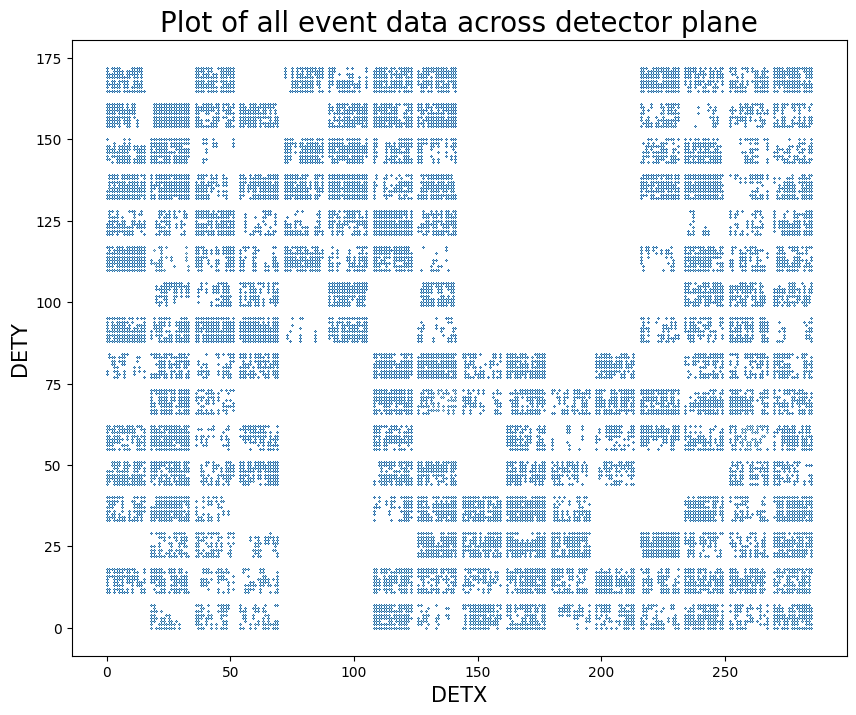

In [9]:
plt.figure(figsize=(10,8))
fig = plt.scatter(ev_data['DETX'], ev_data['DETY'], s=0.0005)
plt.xlabel("DETX", size=15)
plt.ylabel("DETY", size=15)
plt.title("Plot of all event data across detector plane", size=20)
plt.show()

From the same fits file, we can plot the total counts as a function of time throughout the duration of the data. We can see a definite section where we are observing a signal, marked by higher than average peak counts. We can roughly "eyeball" where this section begins and ends. The more regular counts surrounding the signal window will make up our background. 

This is in essence how the background fitting works. Though, instead of evaluating by eye the fit is evaluated quantitatively as will be seen later.

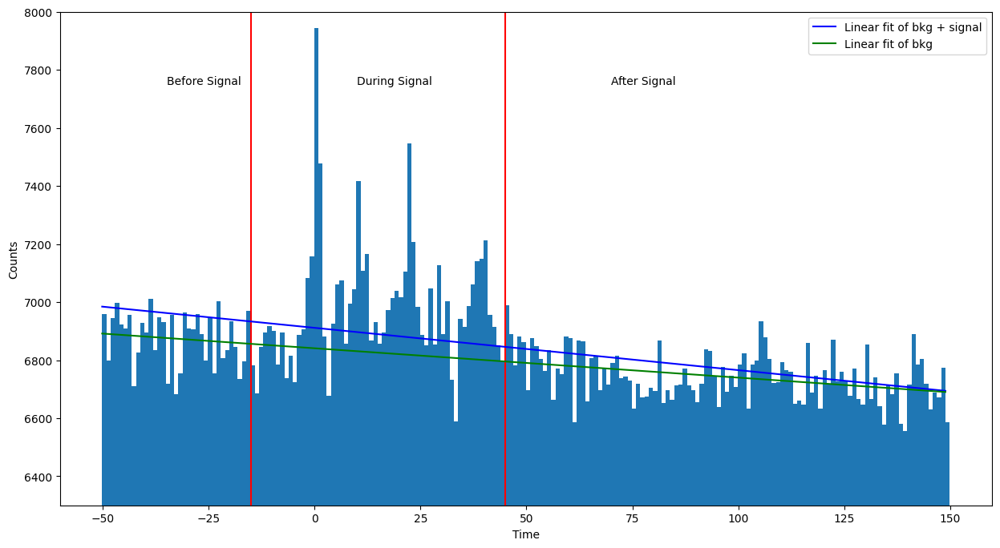

In [10]:
plt.figure(figsize=(15,8))
hist_bin_count, bins, _ = plt.hist(ev_data['TIME'] - trigtime, 200)
ax = plt.gca()
ax.set_ylim([6300, 8000])
plt.xlabel("Time")
plt.ylabel("Counts")

# Plotting vertical lines demarcating different zones within the time window
plt.axvline(x=-15, color='r')
plt.axvline(x=45, color='r')

# Adding clarifying text
ax.text(-35, 7750, 'Before Signal')
ax.text(70, 7750, 'After Signal')
ax.text(10, 7750, 'During Signal')

# Plotting linear fit of bkg + signal counts
from scipy.stats import linregress
lin_fit_bkg_sig = linregress(bins[:-1], hist_bin_count)
lin_x = np.linspace(min(bins[:-1]), max(bins[:-1]), 200)
bkg_sig_y = lin_fit_bkg_sig.slope * lin_x + lin_fit_bkg_sig.intercept
plt.plot(lin_x, bkg_sig_y, color='b',label="Linear fit of bkg + signal")


# Plotting linear fit of bkg counts
bkg_bins = bins[:-1]
bkg_bins_loc = np.logical_or(bkg_bins <= -15, bkg_bins >= 45)
bkg_bins = bkg_bins[bkg_bins_loc]
bkg_counts = hist_bin_count[bkg_bins_loc]

lin_fit_bkg = linregress(bkg_bins, bkg_counts)
bkg_y = lin_fit_bkg.slope * lin_x + lin_fit_bkg.intercept
plt.plot(lin_x, bkg_y, color='g',label="Linear fit of bkg")
plt.legend()


Before going through the actual background fitting process, we have the opportunity to comb through the current data. We can plot the detector plane like before, but colouring each of the detectors according to the number of counts registered. The count sources can be divided into either point sources or diffuse sources. For diffuse sources specifically, the count rates for each detector are proportional to their solid angle exposure to the sky. Thus we would expect the distribution of counts from just the background (which is predominantly made up of diffuse sources) to be similar to the solid angle dpi. 

Below we plot the solid angle dpi and overlay on top the detector array.

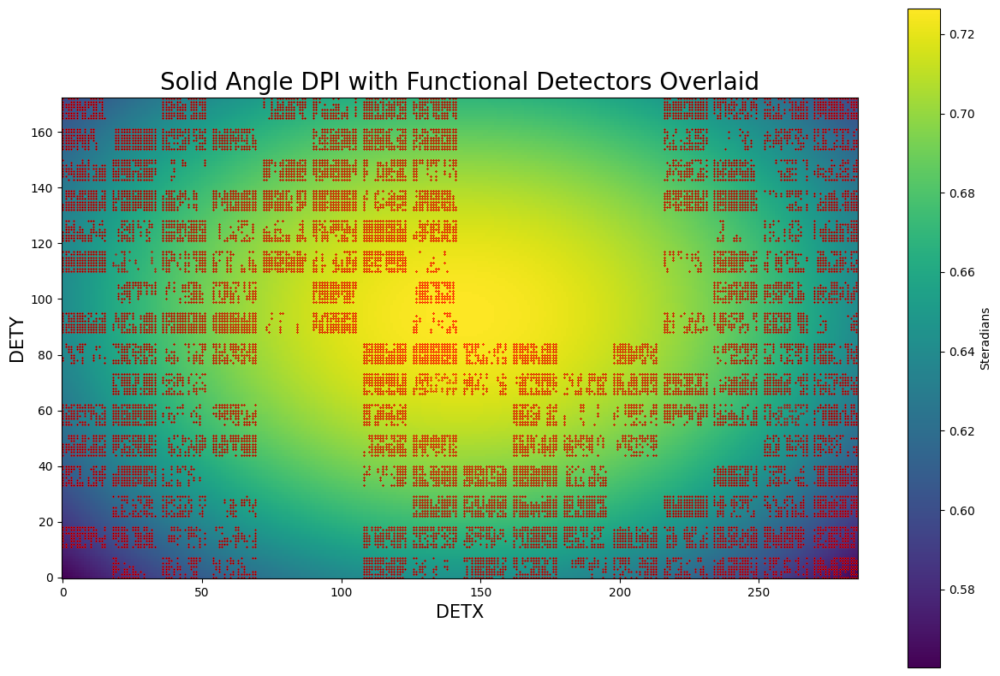

In [11]:
solid_angle_dpi = np.load(solid_angle_dpi_fname)

plt.figure(figsize=(15,10))
plt.imshow(solid_angle_dpi)
plt.colorbar(label="Steradians")
plt.scatter(ev_data['DETX'], ev_data['DETY'], color='r',s=0.0005)
plt.title("Solid Angle DPI with Functional Detectors Overlaid",size=20)
plt.xlabel("DETX", size=15)
plt.ylabel("DETY", size=15)
plt.gca().invert_yaxis()

Here we plot the detector counts for the whole time window so this would include both the signal and background windows that we sectioned off by eye. 

Note that at around (255,60) and (135,70) we have two regions that are anomalously undercounting in comparison to the neighbouring detector grids. This could very well be due to defective detectors that were not appropriately filtered out from the data.

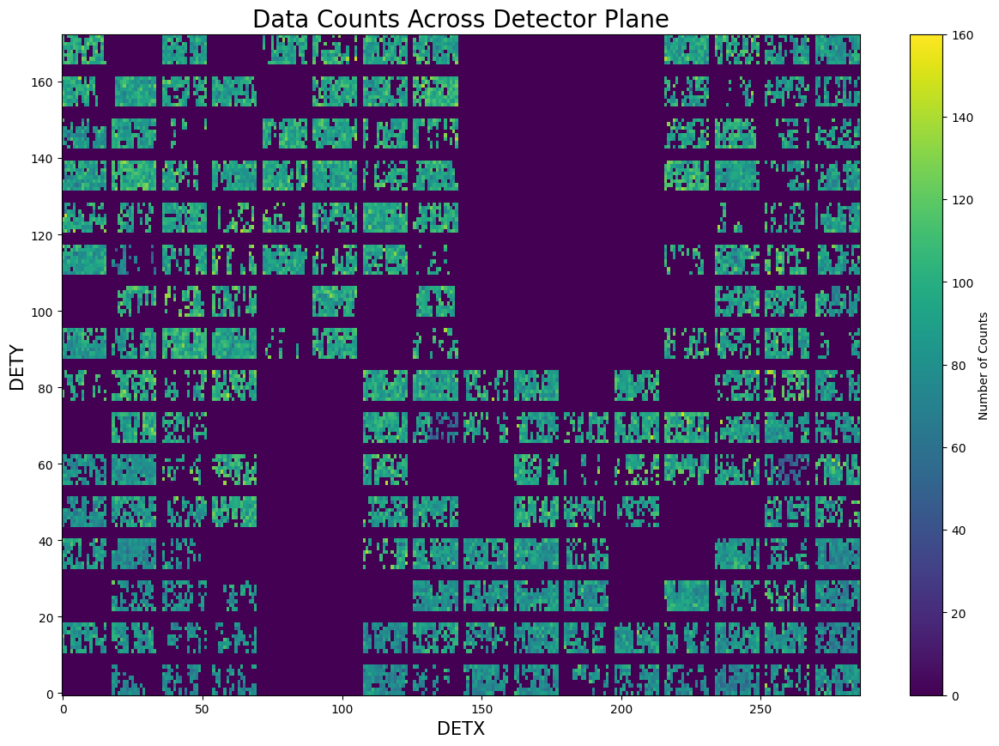

In [12]:
plt.figure(figsize=(15,10))
xbins = np.arange(286+1) - 0.5
ybins = np.arange(173+1) - 0.5
plt.hist2d(ev_data['DETX'], ev_data['DETY'], bins=[xbins,ybins], vmin=0, vmax=160,cmin=0)
plt.xlabel("DETX", size=15)
plt.ylabel("DETY", size=15)
plt.colorbar(label="Number of Counts")
plt.title("Data Counts Across Detector Plane", size=20)
plt.show()

We can remove the events ranging between the "eyeballed" signal window of -15s and 45s. We plot the corresponding dpi below.

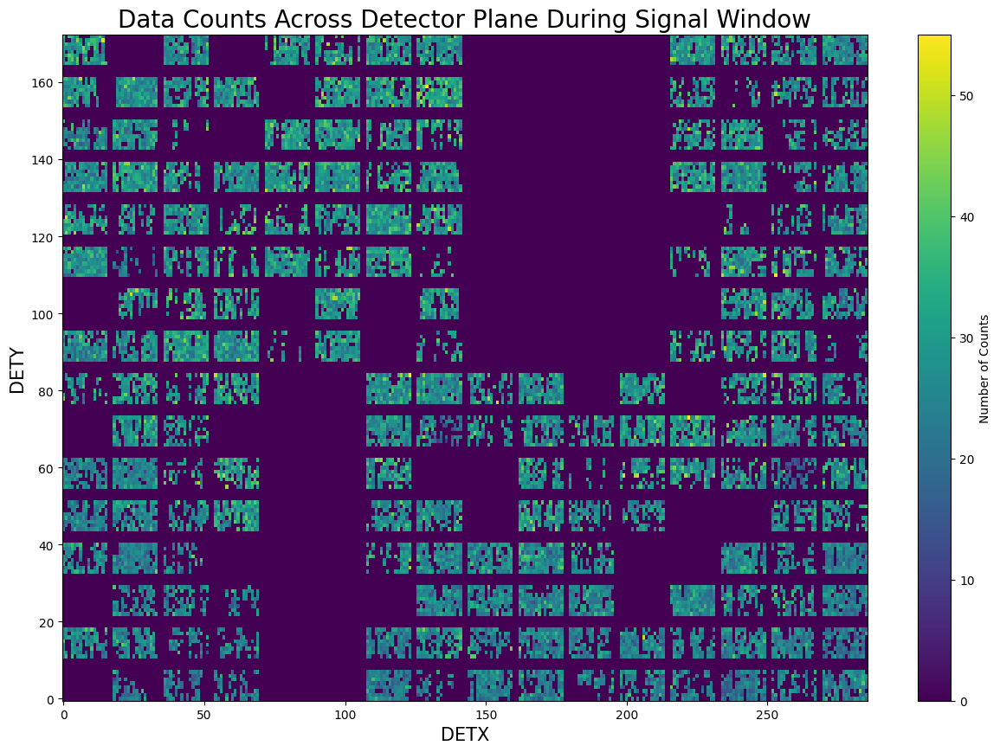

In [13]:
signal_data = ev_data[np.logical_and((ev_data['TIME'] - trigtime) >= -15, (ev_data['TIME'] - trigtime) <= 45)]

plt.figure(figsize=(15,10))
xbins = np.arange(286+1) - 0.5
ybins = np.arange(173+1) - 0.5
plt.hist2d(signal_data['DETX'], signal_data['DETY'], bins=[xbins,ybins], cmin=0)
plt.xlabel("DETX", size=15)
plt.ylabel("DETY", size=15)
plt.colorbar(label="Number of Counts")
plt.title("Data Counts Across Detector Plane During Signal Window", size=20)
plt.show()

Likwise, we generate the dpi for the corresponding background window. Even with the makeshift sectioning of the signal and background time windows we can see that within our background window, the count rates bear some familiarity with the solid angle dpi. 

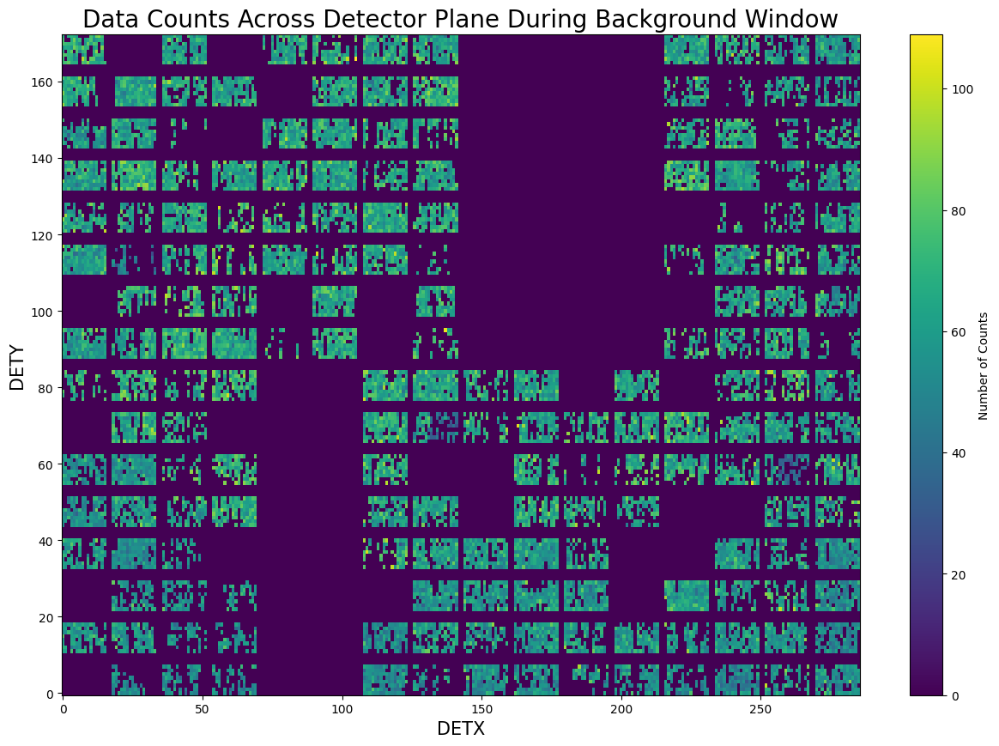

In [14]:
bkg_data = ev_data[np.logical_or((ev_data['TIME'] - trigtime) <= -15, (ev_data['TIME'] - trigtime) >= 45)]

plt.figure(figsize=(15,10))
xbins = np.arange(286+1) - 0.5
ybins = np.arange(173+1) - 0.5
plt.hist2d(bkg_data['DETX'], bkg_data['DETY'], bins=[xbins,ybins], cmin=0)
plt.xlabel("DETX", size=15)
plt.ylabel("DETY", size=15)
plt.colorbar(label="Number of Counts")
plt.title("Data Counts Across Detector Plane During Background Window", size=20)
plt.show()

We can additionally segment the event data between counts from high energy and low energy detections. At high enough energies, particles are able to bypass any of the craft's shielding and lead masks, resulting in a flatter distribution of counts. Our anticipation with separating the events this way is that low energy (<=64keV) counts will be distributed according to the solid angle dpi while high energy (>64keV) will be more uniformly distributed.

In [15]:
low_energy_data = ev_data[ev_data['ENERGY'] <= 64]
high_energy_data = ev_data[np.logical_and(ev_data['ENERGY'] > 64,ev_data['ENERGY'] < 350)]

Indeed, as we plot the respective data, we can see that lower energy counts are distributed according to the solid angle dpi. For high energies, we can see that counts are broadly uniform across the detector plane. There are natural variances in the number of counts in some detectors, with some counting up to 50+ detections. 

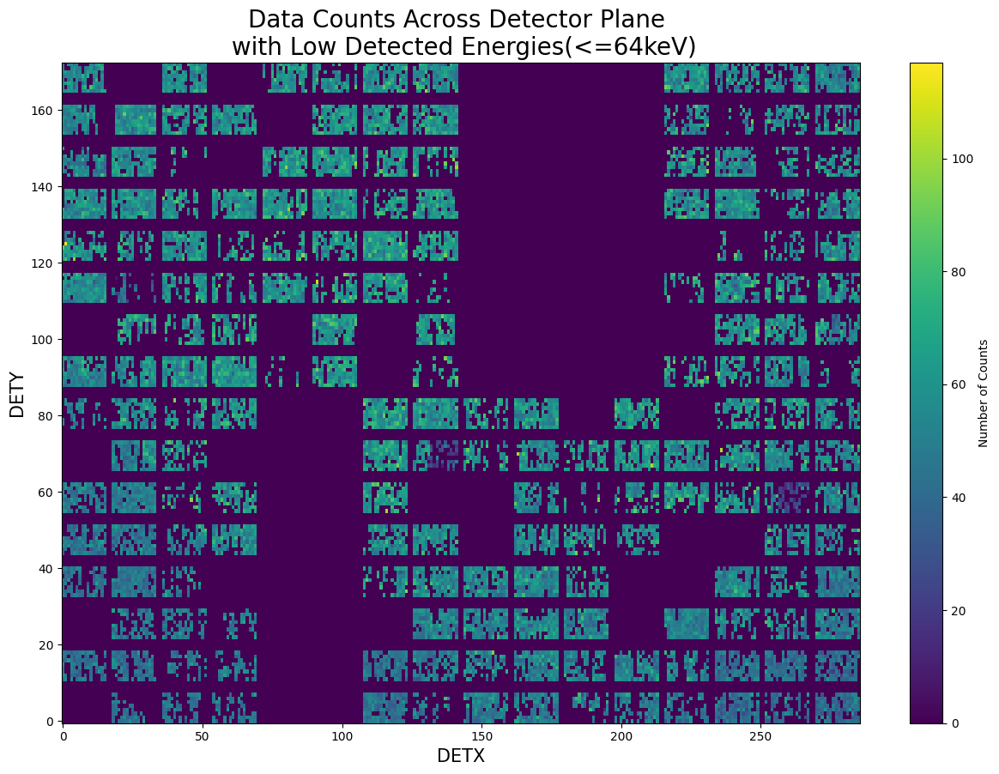

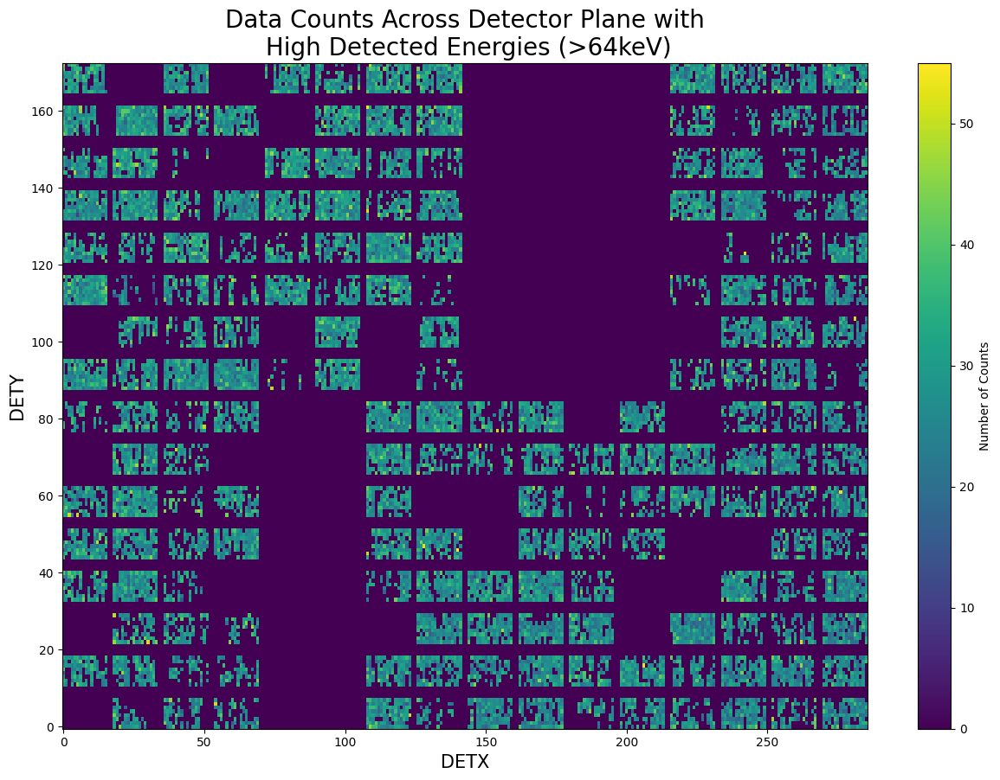

In [16]:
plt.figure(figsize=(15,10))
xbins = np.arange(286+1) - 0.5
ybins = np.arange(173+1) - 0.5
plt.hist2d(low_energy_data['DETX'], low_energy_data['DETY'], bins=[xbins,ybins], cmin=0)
plt.xlabel("DETX", size=15)
plt.ylabel("DETY", size=15)
plt.colorbar(label="Number of Counts")
plt.title("Data Counts Across Detector Plane \n with Low Detected Energies(<=64keV)", size=20)
plt.show()

plt.figure(figsize=(15,10))
xbins = np.arange(286+1) - 0.5
ybins = np.arange(173+1) - 0.5
plt.hist2d(high_energy_data['DETX'], high_energy_data['DETY'], bins=[xbins,ybins], cmin=0)
plt.xlabel("DETX", size=15)
plt.ylabel("DETY", size=15)
plt.colorbar(label="Number of Counts")
plt.title("Data Counts Across Detector Plane with\n High Detected Energies (>64keV)", size=20)
plt.show()

---

## **Performing the Background Fit**
___

We now go through the background fitting process as written in the main function of do_bkg_estimation_wPSs_mp2.py. The cell below retrieves the requisite data needed for the background fit. This includes the BAT attitude data, detector mask, the GTIs associated with the events in events file, and energy bins.

In [17]:
attfile = fits.open(os.path.join(work_dir,'attitude.fits'))[1].data
dmask = fits.open(os.path.join(work_dir,'detmask.fits'))[0].data
bl_dmask = (dmask==0.)
ndets = np.sum(dmask==0)

ebins0 = np.array([15.0, 24.0, 35.0, 48.0, 64.0])
ebins0 = np.append(ebins0, np.logspace(np.log10(84.0), np.log10(500.0), 5+1))[:-1]
ebins0 = np.round(ebins0, decimals=1)[:-1]
ebins1 = np.append(ebins0[1:], [350.0])
nebins = len(ebins0)

try:
    GTI = Table.read(evfname, hdu='GTI_POINTING')
    print("Found GTI_POINTING events")
except:
    GTI = Table.read(evfname, hdu='GTI')
    print("Did not find GTI_POINTING events")

gti_bl = (GTI['STOP']>(trigtime-2e3))&(GTI['START']<(trigtime+2e3))

tot_exp = 0.0
for row in GTI:
    tot_exp += (row['STOP'] - row['START'])

tmin = GTI['START'][0]
tmax = GTI['STOP'][-1]
tmids = (GTI['START']+GTI['STOP'])/2.
tmid = tmids[np.argmin(np.abs(tmids - trigtime))]

print("tmin = ", tmin)
print("tmax = ", tmax)
print("tmid = ", tmid)

Found GTI_POINTING events
tmin =  646018333.0
tmax =  646018533.0953
tmid =  646018433.04765


### Setting Up for Initial Fit


We must also check for any bright, point sources that may be in the FOV of BAT. Such point sources are bright enough to contribute a large number of counts within short time frames and need to be accounted for in the background model. 

The sources are compiled into a table by the function get_srcs_infov(). The function consults a table of all known, bright sources and compares their (imx,imy) coordinates with a range of (imx,imy) coordinates that represent the FOV of BAT itself. This FOV is defined as |imx| < 1.75 and |imy| < 0.95. Thus, any source within this rectangular grid of (imx,imy) coordinates is added into the table of sources. 

The plot below represents the instrument view of the sky and the locations of all of the bright sources in this view. 

Text(1.8, 0.75, 'Outside \n FOV')

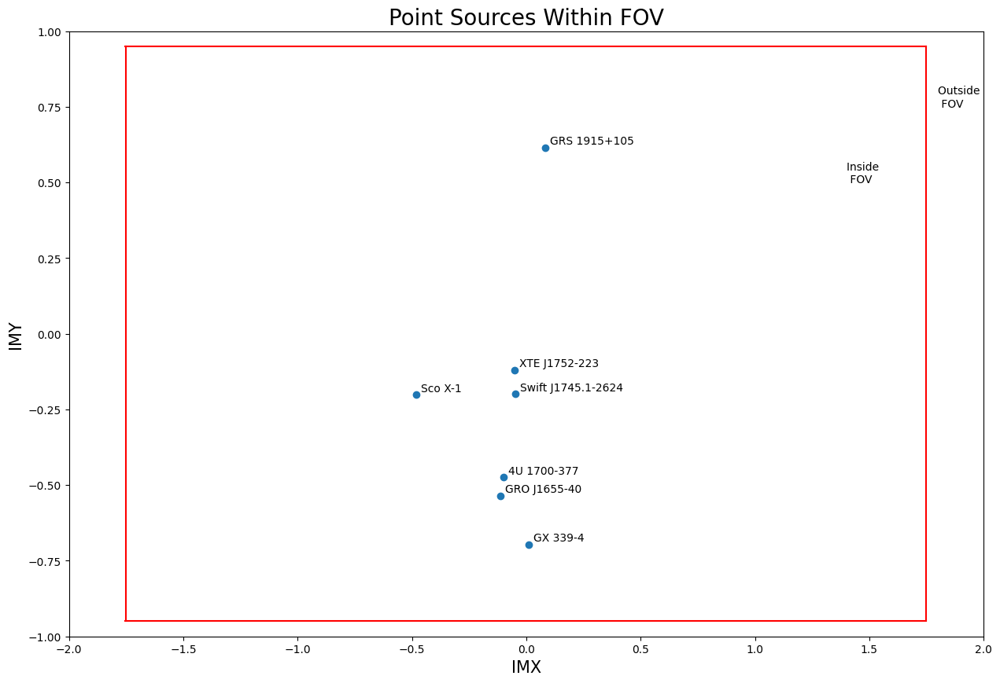

In [18]:
# Finding all sources within the FOV
src_tab = get_srcs_infov(attfile, tmid)
Nsrcs = len(src_tab)

plt.figure(figsize=(15,10))
src_imx = src_tab['imx']
src_imy = src_tab['imy']
src_names = src_tab['Name']

plt.scatter(src_imx, src_imy)
ax = plt.gca()

for i, name in enumerate(src_names):
    ax.text(src_imx[i]+0.02, src_imy[i]+0.01, name)

plt.title("Point Sources Within FOV",size=20)
plt.xlabel("IMX", size=15)
plt.ylabel("IMY", size=15)
plt.xlim((-2.0, 2.0))
plt.ylim((-1.0, 1.0))

plt.axvline(1.75, ymin=0.025, ymax=0.975, color='r')
plt.axvline(-1.75, ymin=0.025,ymax=0.975, color='r')
plt.axhline(-0.95, xmin=0.061, xmax=0.937, color='r')
plt.axhline(0.95, xmin=0.061, xmax=0.937,color='r')

ax = plt.gca()
ax.text(1.4, 0.5, 'Inside \n FOV', size=10)
ax.text(1.8, 0.75, 'Outside \n FOV', size=10)

For context, a row entry in the source table will look like the following:

In [19]:
src_tab

Name,RAJ2000_1,DEJ2000_1,OType,Class_1,M,P7,V,SimbadName_1,RAJ2000,DEJ2000,S/N,Flux,Gamma,PntSep,imx,imy
,deg,deg,,,mCrab,mCrab,,,deg,deg,,1e-15 W / m2,,deg,,
bytes23,float32,float32,bytes14,bytes8,float32,float32,float32,bytes23,float64,float64,float64,float64,float32,float64,float64,float64
Sco X-1,244.979,-15.64,LMXB/NS,Variable,1225.5,3330.1,39.02,Sco X-1,244.9790972,-15.6404628,14050.0,20618.1,5.67,27.47406350801537,-0.4801726284172064,-0.20015462768783537
4U 1700-377,255.987,-37.844,HMXB/NS,Variable,170.3,1556.4,177.81,4U 1700-377,255.9867046,-37.8441241,1840.22,3661.16,2.62,25.836743677173175,-0.09814101475635051,-0.4742022577554519
Swift J1745.1-2624,266.295,-26.403,LMXB/BHC,Outburst,156.9,874.3,251.92,SWIFT J174510.8-262411,266.2943939,-26.4019522,255.09,225.46,5.84,11.474579294045512,-0.04705390727205368,-0.19750312687759267
XTE J1752-223,268.063,-22.342,LMXB/BHC,Outburst,16.6,793.8,31.83,XTE J1752-223,268.0626548,-22.3422849,93.28,266.5,1.85,7.362295425601161,-0.049772523525392326,-0.11931342027891473
GRO J1655-40,253.501,-39.846,LMXB/BH,Outburst,4.6,771.4,9.89,GRO J1655-40,253.4627046,-39.874758,28.27,53.53,2.26,28.661345245239353,-0.11240795100263976,-0.5349694446802211
GX 339-4,255.706,-48.79,LMXB/BH,Outburst,26.8,698.0,48.55,GX 339-4,255.7027889,-48.7872111,275.3,647.86,1.9,34.83280568586497,0.009738071340069588,-0.6957855783608099
GRS 1915+105,288.798,10.946,LMXB/BH,Variable,293.8,681.4,407.55,GRS 1915+105,288.7977066,10.94554691,2706.96,4699.44,3.09,31.849361776876233,0.08212366698248219,0.6157402106169829



### A Note on Performance

In order to cut down on the runtime, we will just take the first source in the source tab and set our number of sources to 1. For Nsrcs larger than 1, the runtime for the cell following this one dramatically increases. At Nsrcs = 0, runtime is about 0.1s and for Nsrcs = 1 runtime is about 8.0s. We suggest keeping it at either 0 or 1 for reasonable runtimes. To set it to zero sources, just replace the index with 0 and set Nsrcs to 0.


In [20]:
src_tab = src_tab[5:6]
Nsrcs = 1
print(src_tab)

  Name   RAJ2000_1 DEJ2000_1 ...         imx                  imy        
            deg       deg    ...                                         
-------- --------- --------- ... -------------------- -------------------
GX 339-4   255.706    -48.79 ... 0.009738071340069588 -0.6957855783608099


---

We set up the following objects for use in the next cell where we will begin the initial fit. To begin the fitting process, we perform an initial fit using all of the TTE data outside of a signal time window. This signal time window is defined below with asymmetric bounds -10s and +20s about the trigger time. 

In [21]:
sig_dtwind = (-10*1.024, 20*1.024)
sig_twind = (trigtime + sig_dtwind[0], trigtime + sig_dtwind[1])

print(sig_twind)

bkg_mod = Bkg_Model_wFlatA(bl_dmask, solid_angle_dpi, nebins, use_deriv=True)
llh_obj = LLH_webins(ev_data, ebins0, ebins1, bl_dmask)

(646018372.9387, 646018403.6587)


### Initial Fitting


With the bright sources all accounted for, we can perform our initial fit. In the case of no bright sources present, our initial background fit parameters will be taken from the background model defined above by bkg_mod. Otherwise, we call upon do_init_bkg_wPSs to perform an initial fit on the background model with point source models added for each of the point sources in the FOV. 

Within **do_init_bkg_wPSs**, we call upon another background fitting function, **bkg_withPS_fit**. For this function, we create a grid of displacements in imx and imy coordinates to apply to the imx and imy coordinates of the point sources. Despite knowing the precise location that the point source should lie in the image coordinates, for the purposes of acquiring the best fit, we check to see if the fit is improved by adjusting each PS's coordinates. The result is a calculation of the background negative log likelihood and parameters. Also provided are the TS_nulls which are the calculations for the negative log likelihood for when the parameters for each of the point sources are set to zero.

At the completion of **bkg_withPS_fit**, we return back to the original function with variables bf_nllh, bf_params, and TS_nulls. Point sources are checked to see if they are significantly detected according to the following inequality:
$$\sqrt{2\Delta LLH } < 7$$
Sources for which the above expression is larger than 7 are considered significantly detected and are retained in our compound background + point source model. Otherwise, the point sources are excluded from our background model. 

The result of the fitting process is a dictionary of parameters for the background rates, flat rates for the background model, and the binned rates for the all of the sources (as well as their imx and imy coordinates). The meaning for each type of rate is explained in Example_LLH_setup_fixed_dirs.ipynb.


In [22]:
if Nsrcs > 0:

    rt_dir = os.path.join(NITRATES_path,'ray_traces_detapp_npy')
    print(rt_dir)
    rt_obj = RayTraces(rt_dir)
    
    Nprocs = 1
    if Nsrcs > 1:
        Nprocs = 4

    tmin_ = trigtime-5e2
    tmax_ = trigtime+5e2
    
    print("Beginning initial bkg fit")
    init_bf_params, src_tab = do_init_bkg_wPSs(bkg_mod, llh_obj, src_tab, rt_obj,\
                                                    GTI, sig_twind, Nprocs=Nprocs,\
                                                    tmin=tmin_, tmax=tmax_)

    Nsrcs = len(src_tab)
    Nsrcs = 1
    # Now need to do each time, with these PSs and these imxys

else:
    init_bf_params = {k:bkg_mod.param_dict[k]['val'] for k in bkg_mod.param_names}

print(init_bf_params)

./ray_traces_detapp_npy
Beginning initial bkg fit
{'Background_bkg_rate_0': 0.1131303869574253, 'Background_bkg_rate_1': 0.06990751825960258, 'Background_bkg_rate_2': 0.040741392769990725, 'Background_bkg_rate_3': 0.039534085139260426, 'Background_bkg_rate_4': 0.034413543094693175, 'Background_bkg_rate_5': 0.03449595223060899, 'Background_bkg_rate_6': 0.03279409792816776, 'Background_bkg_rate_7': 0.024519910860385984, 'Background_bkg_rate_8': 0.017575128978036952, 'Background_flat_0': 0.0, 'Background_flat_1': 0.0, 'Background_flat_2': 0.005835134809895061, 'Background_flat_3': 0.005967086920274559, 'Background_flat_4': 0.26221065800705035, 'Background_flat_5': 0.7334750410153207, 'Background_flat_6': 0.8091356931249437, 'Background_flat_7': 1.0, 'Background_flat_8': 1.0, 'GX 339-4_imx': 0.008738071340069587, 'GX 339-4_imy': -0.6947855783608099, 'GX 339-4_rate_0': 0.017926152646352996, 'GX 339-4_rate_1': 0.0073491256502899085, 'GX 339-4_rate_2': 0.0028720758904012887, 'GX 339-4_rate_3'

### Time Windows and Setting Up for Final Fit


We tidy things up for the eventual final fit by creating a compound model that includes the background model and the remaining point source models for each of the significantly detected point sources. We also compile a list of fixed parameters that include any of the background flat rate parameters and imx and imy coordinates.

Again, for no point sources in the FOV, we just take our compound model to be the background model.

In [23]:
if Nsrcs > 0:
    fixed_pars = [pname for pname in list(init_bf_params.keys()) if '_flat_' in pname\
                or '_imx' in pname or '_imy' in pname]
    mod_list = [bkg_mod]
    ps_mods = []
    for i in range(Nsrcs):
        row = src_tab[i]
        mod = Point_Source_Model_Binned_Rates(row['imx'], row['imy'], 0.1,\
                                              [ebins0,ebins1], rt_obj, bl_dmask,\
                                                  use_deriv=True, name=row['Name'])
        ps_mods.append(mod)

    mod_list += ps_mods
    mod = CompoundModel(mod_list)

else:
    init_bf_params = {k:bkg_mod.param_dict[k]['val'] for k in bkg_mod.param_names}
    mod = bkg_mod
    fixed_pars = []

Because we are not actually aware of the precise time of the signal, we perform our final background fitting procedure over a search window. The search window is divided into time windows where the final fit is performed for each window. At each time window, we remove +-10 seconds of the central TTE data in case it encapsulates the actual signal. Then, assuming we have selected the correct time window, the remaining data in the time window contains just the background and can best be used to fit our background model. 

The arrangement of the time windows are given by **t_ax** which uses the interval spacing defined by **dt_ax**. To be clear, **t_ax** itself does not represent the time windows but the arrangement of the midpoints for each time window. The time step between each time window is given by **bkg_tstep**. 

In [24]:
bkg_dur = 60.0*1.024
twind = 20*1.024
bkg_tstep = 1*1.024
sig_wind = 20*1.024

# Setting up time windows for repeating final fits. These represent the middle
# time positions from which we will repeat our final fits. The increments in 
# the time windows is supposed to be 1.024. Time windows will contain data +-40
# seconds from the centre time with +- 10s from the centre time removed.
dt_ax = np.arange(-twind, twind+1, bkg_tstep)
t_ax = dt_ax
Ntpnts = len(dt_ax)
bkg_bf_dicts = []


The time windows themselves are defined first by designating the midpoint **tmid** which is taken from **t_ax**. The signal time window is constructed around this midpoint as defined by **sig_wind** which will be added to our bad time intervals. We also add the bad time intervals which extend from **bkg_t1** to -inf and **bkg_t0** to +inf. 

The following graphs show how the time intervals are laid out about the trigger time and the arrangement of the gtis and btis for a given **tmid** index.

In [25]:
def print_bkg_fit_timestep(i):
    # First plot
    tmid = t_ax[i]
    sig_twind = (-sig_wind/2. + tmid, sig_wind/2. + tmid)
    gti_ = add_bti2gti(sig_twind, GTI)
    bkg_t0 = tmid - sig_wind/4. - bkg_dur/2.
    bkg_t1 = tmid + 3.*sig_wind/4. + bkg_dur/2.
    bkg_bti = Table(data=([-np.inf, bkg_t1], [bkg_t0, np.inf]), names=('START', 'STOP'))
    gti_ = add_bti2gti(bkg_bti, gti_)

    plt.figure(figsize=(15,10))
    hist_bin_count, bins, _ = plt.hist(ev_data['TIME']-trigtime, 200)
    ax = plt.gca()
    ax.set_ylim([6300, 8250])
    plt.xlabel("Time (s)",size=15)
    plt.ylabel("Counts",size=15)

    # Plotting vertical lines demarcating different zones within the time window
    for t in t_ax[:-1]:
        plt.axvline(t, color='r', alpha=0.3)
    plt.axvline(t_ax[-1], color='r', alpha=0.3, label = "t_ax time windows")
    plt.axvline(0, color='g', label = 'Trigger Time')
    plt.axvline(tmid, color='y', alpha=1.0, label = "Current tmid")
    plt.legend()
    plt.title("Location of trigger time and current tmid", size=20)

    # Second plot
    tmid = t_ax[i]
    sig_twind = (-sig_wind/2. + tmid, sig_wind/2. + tmid)
    #sig_twind = (-sig_wind/4. + tmid, 3.*sig_wind/4. + tmid)
    gti_ = add_bti2gti(sig_twind, GTI)
    bkg_t0 = tmid - sig_wind/4. - bkg_dur/2.
    bkg_t1 = tmid + 3.*sig_wind/4. + bkg_dur/2.
    bkg_bti = Table(data=([-np.inf, bkg_t1], [bkg_t0, np.inf]), names=('START', 'STOP'))
    gti_ = add_bti2gti(bkg_bti, gti_)

    plt.figure(figsize=(15,10))
    hist_bin_count, bins, _ = plt.hist(ev_data['TIME']-trigtime, 200)
    ax = plt.gca()
    ax.set_ylim([6300, 8250])
    plt.xlabel("Time (s)",size=15)
    plt.ylabel("Counts",size=15)

    # Plotting vertical lines demarcating different zones within the time window
    for t in t_ax:
        plt.axvline(t, color='r', alpha=0.3)

    #plt.axvline(trigtime-646018360, color='g')
    plt.axvline(sig_twind[0], color='b')
    plt.axvline(sig_twind[1], color='b')
    plt.axvline(tmid, color='y')
    ax.text(sig_twind[0]-27, 8000, "sig_twind[0]",size=15)
    ax.text(sig_twind[1], 8000, "sig_twind[1]",size=15)
    plt.axvspan(sig_twind[0], sig_twind[1], color='b', alpha = 0.2, label="signal time window/bti")
    plt.axvspan(bkg_t1, ax.get_xlim()[1], color='g', alpha = 0.2, label="bti")
    plt.axvspan(bkg_t0, ax.get_xlim()[0], color='g', alpha = 0.2)
    plt.axvspan(bkg_t0, sig_twind[0], color='r', alpha = 0.2)
    plt.axvspan(sig_twind[1], bkg_t1, color='r', alpha = 0.2, label="gti")
    plt.legend()

    plt.axvline(bkg_t0, color='g')
    plt.axvline(bkg_t1, color='g')
    ax.text(bkg_t0-15, 8100, "bkg_t0",size=15)
    ax.text(bkg_t1, 8100, "bkg_t1",size=15)
    plt.title("Signal time window for tmid = {c}".format(c=tmid), size=20)
    

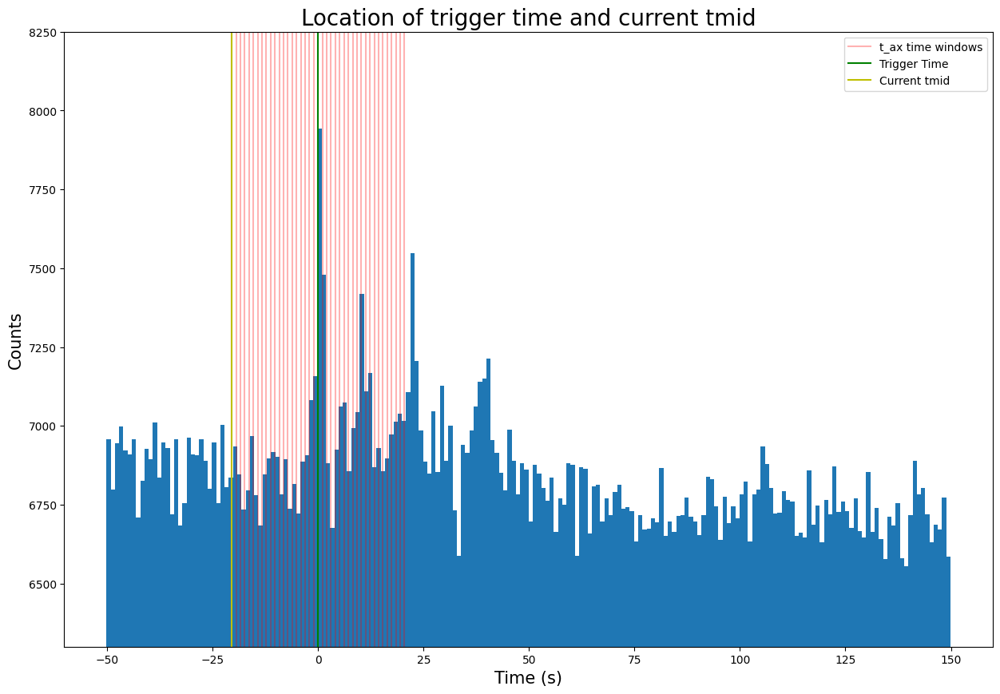

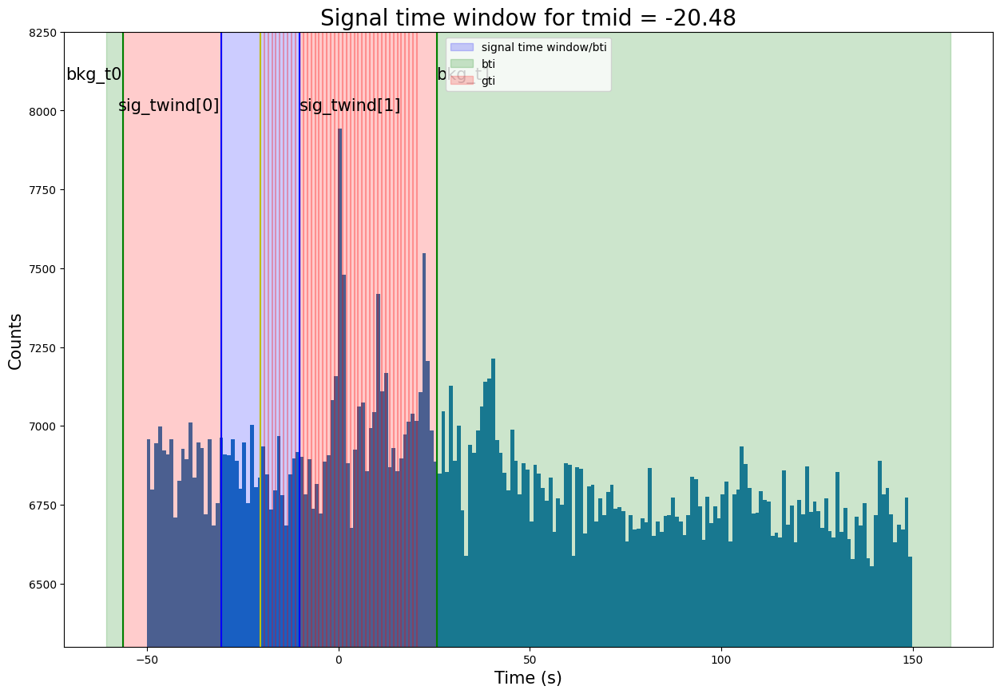

In [26]:
# Printing the 0th timestep in the background fitting loop
print_bkg_fit_timestep(0)

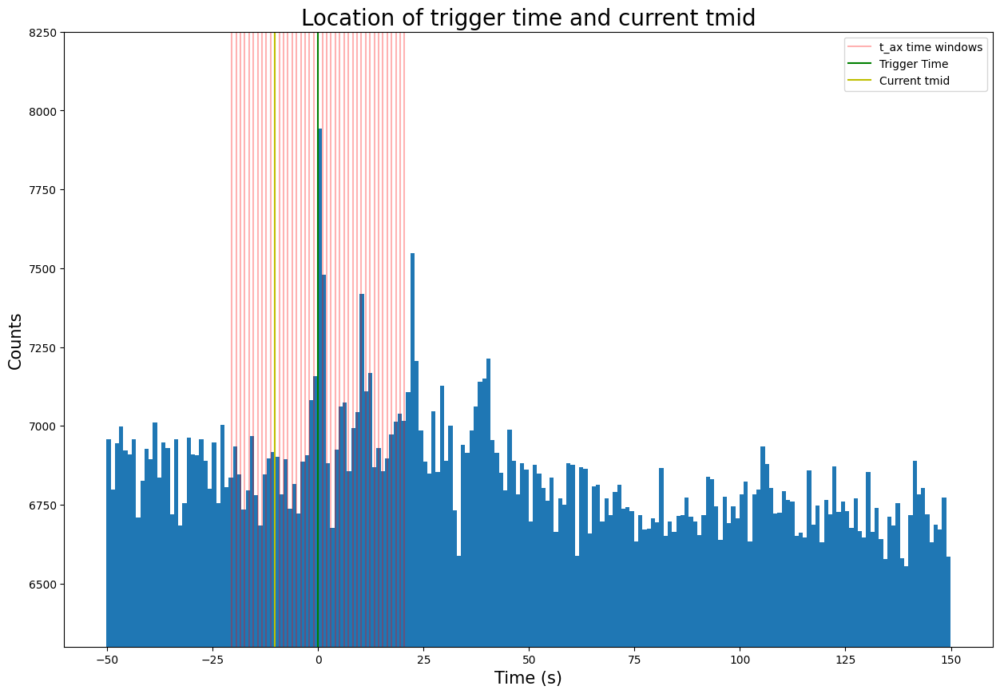

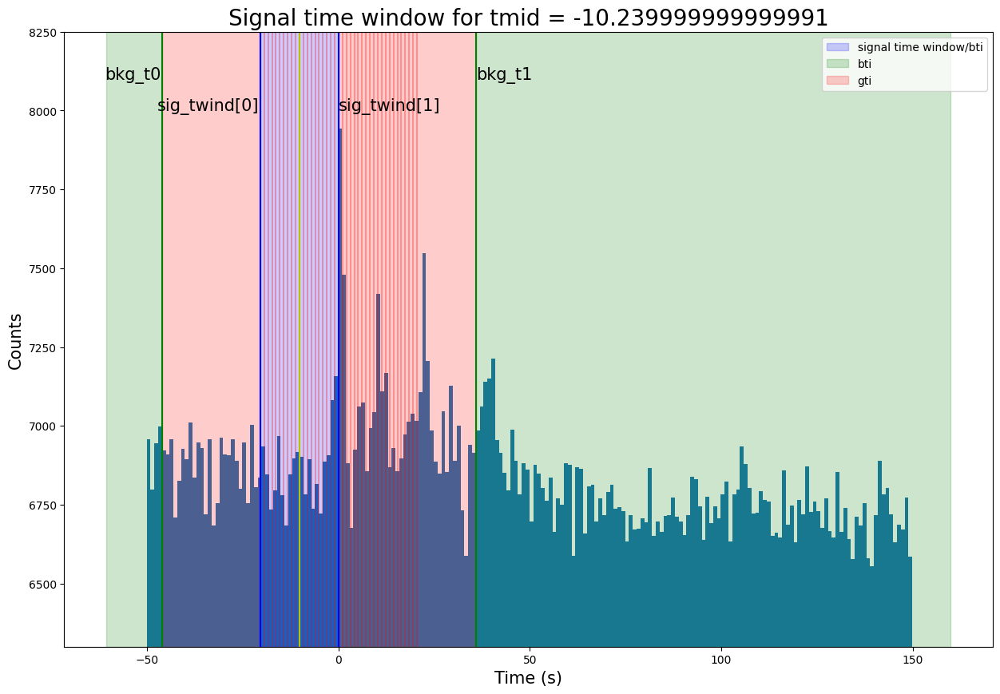

In [27]:
# Printing the 10th timestep
print_bkg_fit_timestep(10)

### Final Fitting


With that visualization out of the way, we can do the final fits across all of the time windows, **t_ax**. Provided that the total exposure is at least 10.0s we can do a final fit on the time interval by calling the function bkg_withPS_fit_fiximxy. For each call, we update a dictionary of parameters with the results of the final fit (most noteably the calculated nllh) and add the dictionary to a list of background fit parameters.

For Nsrcs = 1, the runtime is around 6-7s. 

In [28]:
for i in range(Ntpnts):

    tmid = t_ax[i]+trigtime
    sig_twind = (-sig_wind/2. + tmid, sig_wind/2. + tmid)
    #sig_twind = (-sig_wind/4. + tmid, 3.*sig_wind/4. + tmid)
    gti_ = add_bti2gti(sig_twind, GTI)
    # bkg_t0 = tmid - sig_wind/2. - bkg_dur/2.
    # bkg_t1 = tmid + sig_wind/2. + bkg_dur/2.
    bkg_t0 = tmid - sig_wind/4. - bkg_dur/2.
    bkg_t1 = tmid + 3.*sig_wind/4. + bkg_dur/2.
    bkg_bti = Table(data=([-np.inf, bkg_t1], [bkg_t0, np.inf]), names=('START', 'STOP'))
    gti_ = add_bti2gti(bkg_bti, gti_)
    print(tmid - trigtime)
    print(gti_)
    t0s = gti_['START']
    t1s = gti_['STOP']
    exp = 0.0
    for ii in range(len(t0s)):
        exp += (t1s[ii] - t0s[ii])
    if exp < 10.0:
        continue

    nllh, params, errs_dict, corrs_dict = bkg_withPS_fit_fiximxy(src_tab, mod, llh_obj, t0s, t1s,\
                                                                     copy(init_bf_params),\
                                                                     fixed_pnames=fixed_pars)

    params.update(errs_dict)
    params.update(corrs_dict)
    params['nllh'] = nllh
    params['time'] = tmid
    params['dt'] = tmid - trigtime
    bkg_bf_dicts.append(params)
    params['exp'] = llh_obj.dt

-20.480000019073486
    START           STOP     
-------------- --------------
   646018333.0 646018352.4587
646018372.9387 646018408.7787
{'Background_bkg_rate_0': 0.11426516231005723, 'Background_bkg_rate_1': 0.06990751825960258, 'Background_bkg_rate_2': 0.040741392769990725, 'Background_bkg_rate_3': 0.039534085139260426, 'Background_bkg_rate_4': 0.034413543094693175, 'Background_bkg_rate_5': 0.03449595223060899, 'Background_bkg_rate_6': 0.03279409792816776, 'Background_bkg_rate_7': 0.024519910860385984, 'Background_bkg_rate_8': 0.017575128978036952, 'Background_flat_0': 0.0, 'Background_flat_1': 0.0, 'Background_flat_2': 0.005835134809895061, 'Background_flat_3': 0.005967086920274559, 'Background_flat_4': 0.26221065800705035, 'Background_flat_5': 0.7334750410153207, 'Background_flat_6': 0.8091356931249437, 'Background_flat_7': 1.0, 'Background_flat_8': 1.0, 'GX 339-4_imx': 0.008738071340069587, 'GX 339-4_imy': -0.6947855783608099, 'GX 339-4_rate_0': 0.018400510041630107, 'GX 339-4_

The list of background fit dictionaries gets saved into a .csv file which we can later read in when going through the full likelihood analysis, as in Example_LLH_setup_fixed_dirs.ipynb

In [29]:
bkg_df = pd.DataFrame(bkg_bf_dicts)
save_fname = 'bkg_estimation.csv'
bkg_df.to_csv(save_fname, index=False)
bkg_df.head()

,Background_bkg_rate_0,Background_bkg_rate_1,Background_bkg_rate_2,Background_bkg_rate_3,Background_bkg_rate_4,Background_bkg_rate_5,Background_bkg_rate_6,Background_bkg_rate_7,Background_bkg_rate_8,Background_flat_0,...,corr_Background_bkg_rate_3_GX 339-4_rate_3,corr_Background_bkg_rate_4_GX 339-4_rate_4,corr_Background_bkg_rate_5_GX 339-4_rate_5,corr_Background_bkg_rate_6_GX 339-4_rate_6,corr_Background_bkg_rate_7_GX 339-4_rate_7,corr_Background_bkg_rate_8_GX 339-4_rate_8,nllh,time,dt,exp
0,0.114265,0.071079,0.041472,0.040652,0.035669,0.036055,0.033756,0.025565,0.018110,0.0,...,-0.455158,-0.456371,-0.457192,-0.458304,-0.457617,-0.461403,239844.278293,6.460184e+08,-20.480,55.2987
1,0.114339,0.071085,0.041368,0.040646,0.035558,0.036059,0.033802,0.025512,0.018037,0.0,...,-0.455038,-0.456467,-0.456261,-0.459083,-0.457757,-0.460636,241309.784265,6.460184e+08,-19.456,56.3227
2,0.114344,0.071159,0.041477,0.040619,0.035605,0.036056,0.033726,0.025476,0.018044,0.0,...,-0.454544,-0.457090,-0.456114,-0.457900,-0.457248,-0.460292,242776.002180,6.460184e+08,-18.432,57.3467
3,0.114433,0.071145,0.041451,0.040591,0.035572,0.035980,0.033750,0.025475,0.018068,0.0,...,-0.454043,-0.457037,-0.455375,-0.458072,-0.457088,-0.459900,244255.828937,6.460184e+08,-17.408,58.3707
4,0.114713,0.071157,0.041476,0.040717,0.035572,0.035923,0.033782,0.025478,0.018059,0.0,...,-0.455068,-0.457099,-0.455717,-0.459035,-0.456887,-0.459261,245641.227992,6.460184e+08,-16.384,59.3947


As an example, the 0th fit window yielded the following dictionary of fit parameters

In [30]:
bkg_bf_dicts[0]

{'Background_bkg_rate_0': 0.11426516231005723,
 'Background_bkg_rate_1': 0.07107941707712075,
 'Background_bkg_rate_2': 0.0414721520597145,
 'Background_bkg_rate_3': 0.04065200403397531,
 'Background_bkg_rate_4': 0.03566928445921054,
 'Background_bkg_rate_5': 0.03605480648428634,
 'Background_bkg_rate_6': 0.0337563159737696,
 'Background_bkg_rate_7': 0.02556545060204392,
 'Background_bkg_rate_8': 0.018110176022807744,
 'Background_flat_0': 0.0,
 'Background_flat_1': 0.0,
 'Background_flat_2': 0.005835134809895061,
 'Background_flat_3': 0.005967086920274559,
 'Background_flat_4': 0.26221065800705035,
 'Background_flat_5': 0.7334750410153207,
 'Background_flat_6': 0.8091356931249437,
 'Background_flat_7': 1.0,
 'Background_flat_8': 1.0,
 'GX 339-4_imx': 0.008738071340069587,
 'GX 339-4_imy': -0.6947855783608099,
 'GX 339-4_rate_0': 0.018400510041630107,
 'GX 339-4_rate_1': 0.0075881130536956595,
 'GX 339-4_rate_2': 0.004397593200077019,
 'GX 339-4_rate_3': 0.003310942522856706,
 'GX 339-

--- 
## **Comparing the Best Background Fit (1 Point Source) to Data During Background Fit Time Window**
---

We will now look at the rate dpis for the best background fit. We search the dictionary of background fits for the parameter dictionary with the largest value for **nllh**. From this dictionary we can get the time window of the best fit with the 'time' and 'exp' parameters.

In [31]:
from nitrates.lib import get_conn, det2dpi, mask_detxy, get_info_tab, get_twinds_tab, ang_sep, theta_phi2imxy, \
    imxy2theta_phi, convert_imxy2radec, convert_radec2thetaphi, convert_radec2imxy
from nitrates.models import Cutoff_Plaw_Flux, Plaw_Flux, get_eflux_from_model, Source_Model_InOutFoV, \
    Bkg_Model_wFlatA, CompoundModel, Point_Source_Model_Binned_Rates, im_dist, Bkg_and_Point_Source_Model

best_nllh = 0.0
for i in range(len(bkg_bf_dicts)):
    if bkg_bf_dicts[i]['nllh'] > best_nllh:
        param_dict = bkg_bf_dicts[i]
        best_nllh = bkg_bf_dicts[i]['nllh'] 

best_fit_time = param_dict['time'] - trigtime
exp = param_dict['exp']


print("Time window of best fit: ", best_fit_time)
print("Exposure: ", exp)
print("Best nllh: ", best_nllh)

Time window of best fit:  -13.312000036239624
Exposure:  61.44000005722046
Best nllh:  248324.33514527624


The following dictionary represents the best fitting parameters for the background

In [32]:
ebins = [ebins0, ebins1]
param_dict

{'Background_bkg_rate_0': 0.11466907091417632,
 'Background_bkg_rate_1': 0.07095786835188621,
 'Background_bkg_rate_2': 0.041567467512002416,
 'Background_bkg_rate_3': 0.04078392487583211,
 'Background_bkg_rate_4': 0.03551553007592515,
 'Background_bkg_rate_5': 0.03590992349048733,
 'Background_bkg_rate_6': 0.03379641587246757,
 'Background_bkg_rate_7': 0.025444525699223043,
 'Background_bkg_rate_8': 0.01798602804640096,
 'Background_flat_0': 0.0,
 'Background_flat_1': 0.0,
 'Background_flat_2': 0.005835134809895061,
 'Background_flat_3': 0.005967086920274559,
 'Background_flat_4': 0.26221065800705035,
 'Background_flat_5': 0.7334750410153207,
 'Background_flat_6': 0.8091356931249437,
 'Background_flat_7': 1.0,
 'Background_flat_8': 1.0,
 'GX 339-4_imx': 0.008738071340069587,
 'GX 339-4_imy': -0.6947855783608099,
 'GX 339-4_rate_0': 0.018159893494925635,
 'GX 339-4_rate_1': 0.008908844593258816,
 'GX 339-4_rate_2': 0.0044066721206024615,
 'GX 339-4_rate_3': 0.0032033385728500396,
 'GX 

We can now use these parameters to create a Bkg_and_Point_Source_Model. This class has access to .get_rate_dpis() which returns, for each energy bin, a list of rate dpis for each of the functional detectors in the detector array. In this case, we have 9 energy bins and 14932 functioning detectors so the returned object will be a list 9 arrays of length 14932.

In [33]:
final_bkg_and_src_mod = Bkg_and_Point_Source_Model(solid_angle_dpi, ebins, rt_obj, bl_dmask, src_tab['Name'], bkg_row=param_dict)
rate_dpis = final_bkg_and_src_mod.get_rate_dpis(param_dict)

To replicate the dpis from the beginning, we have two functions for collecting the model rate dpis. The first creates the rate dpi for each of the ebins and the second shows the cumulative rate dpis for low energy ebins and high energy ebins (with the ebin index that separates high and low energy bins).

In [34]:
def model_ebin_dpi(rate_dpis, dmask, nebins):
    
    dpis = [] 

    for ebin in range(nebins):
        current_rate = 0
        dpi = np.zeros((len(dmask),len(dmask[0])))
        dpi[bl_dmask] = rate_dpis[ebin]
        
        dpis.append(dpi)
    
    return dpis

    
def model_low_and_high_energy_dpi(rate_dpis, dmask, nebins, highest_low_energy_bin):
    
    dpis = []

    dpi = np.zeros((len(dmask),len(dmask[0])))
    for ebin in range(highest_low_energy_bin+1):
        dpi[bl_dmask] += rate_dpis[ebin]
        
    dpis.append(dpi)

    dpi = np.zeros((len(dmask),len(dmask[0])))
    for ebin in range(highest_low_energy_bin+1, nebins):
        dpi[bl_dmask] += rate_dpis[ebin]

    dpis.append(dpi)
    
    return dpis

In [35]:
model_ebin_dpis = model_ebin_dpi(rate_dpis, dmask, 9)

To compare with the data, we isolate only the TTE data for the time of best fit of the model. The following cell sections off the event data using the time boundaries of best_fit_t0, best_fit_t1, etc.

In [36]:
sig_wind

20.48

In [37]:
best_fit_t0 = best_fit_time - (bkg_dur/ 2.) - (sig_wind/4.)
best_fit_t1 = best_fit_time - (sig_wind/2.)
best_fit_t2 = best_fit_time + (bkg_dur/ 2.) + (3.*sig_wind/4.)
best_fit_t3 = best_fit_time + (sig_wind/2.)
print("Total best fitting time: " ,(best_fit_t1 - best_fit_t0) + (best_fit_t2 - best_fit_t3))
print("exp: ", exp)
best_fit_1 = filter_evdata(ev_data, dmask, ebins0[0], ebins1[-1], best_fit_t0+trigtime, best_fit_t1+trigtime)
best_fit_2 = filter_evdata(ev_data, dmask, ebins0[0], ebins1[-1], best_fit_t3+trigtime, best_fit_t2+trigtime)

best_fit_data = np.lib.recfunctions.stack_arrays((best_fit_1,best_fit_2))
best_fit_data
exp = (best_fit_t1 - best_fit_t0) + (best_fit_t2 - best_fit_t3)

Total best fitting time:  61.43999999999999
exp:  61.44000005722046


In [38]:
print("best_fit_t0: ", best_fit_t0+trigtime)
print("best_fit_t1: ", best_fit_t1+trigtime)
print("tmin: ", tmin)
print("tmax: ", tmax)

best_fit_t0:  646018334.0266999
best_fit_t1:  646018359.6266999
tmin:  646018333.0
tmax:  646018533.0953


We now have a table of data that occured during the best fit time interval. In the following cell, we bin the data by their energies using the same energy bins used in the model

In [39]:
data_ebin_dpis = []
best_fit_data_ebin = []

for i in range(len(ebins0)):
    energy_bin_data = best_fit_data[np.logical_and(best_fit_data['ENERGY'] > ebins0[i],best_fit_data['ENERGY'] < ebins1[i])]
    best_fit_data_ebin.append(energy_bin_data)
    
    xbins = np.arange(286+1) - 0.5
    ybins = np.arange(173+1) - 0.5
    A, xedges, yedges = np.histogram2d(energy_bin_data['DETX'], energy_bin_data['DETY'], bins=[xbins,ybins])
    A_normed = A/exp
    
    data_ebin_dpis.append(np.transpose(A_normed))



We can see from the rate dpis a similar pattern in the distribution of countsin the dpis for the TTE data as we move from low energy bins to high energy bins. Beyond the 35.0keV to 48.0keV energy bin the distribution of counts is more uniform across the detector plane as the high energy detections are less correlated to the solid angle exposures for each of the detectors. 

By comparison to an equivalent dpi for the TTE data separated by ebins, we see this transition towards a flatter dpi occur roughly around the same energy bin of 35.0keV to 48.0keV. The main difference between the data dpis and the background fit dpis is in the variability of the counts in the TTE data. Due to this variability, by the time we reach the higher energy bins our background fit tends to undercount the number of detections. For example, for the very last energy bin from 245.0keV to 350.0keV, the model has an essentially flat rate of around 0.0175. For the equivalent data dpi, the large portion of the count rates have the same rate but because of the variability in the data we have many count rates that reach into the 0.05-0.09 count rates. At the lower energy bins, we have better agreement in the count rates and the distributions of the count rates are nearly equivalent. 

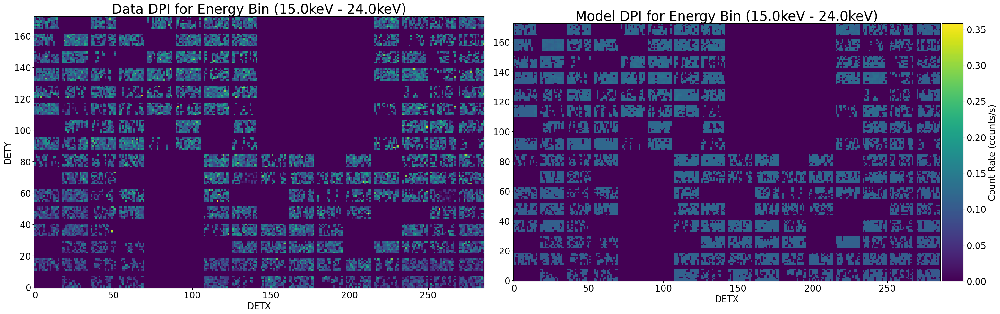

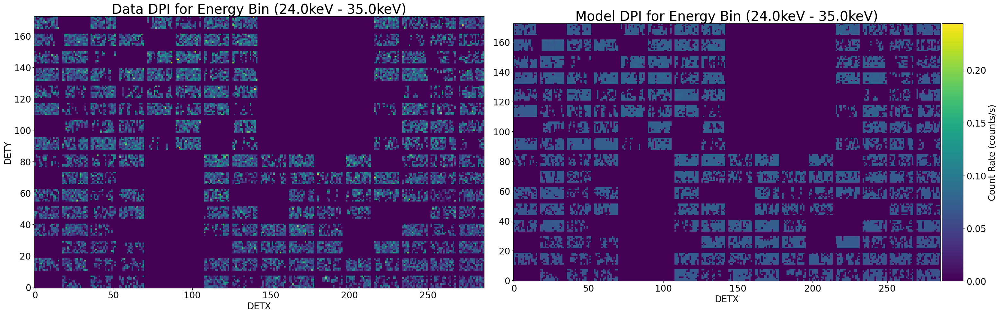

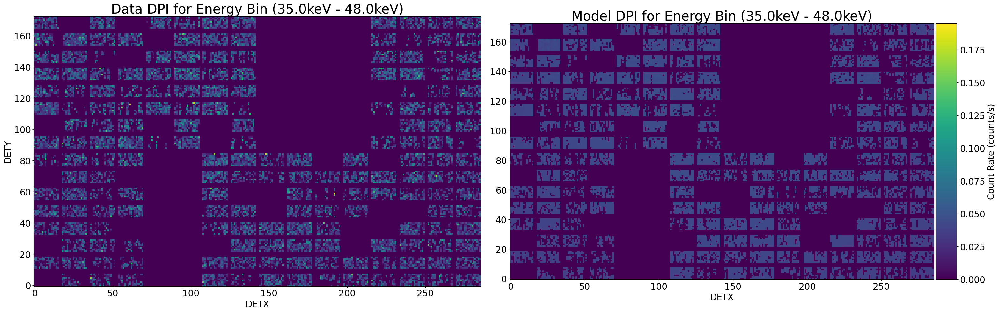

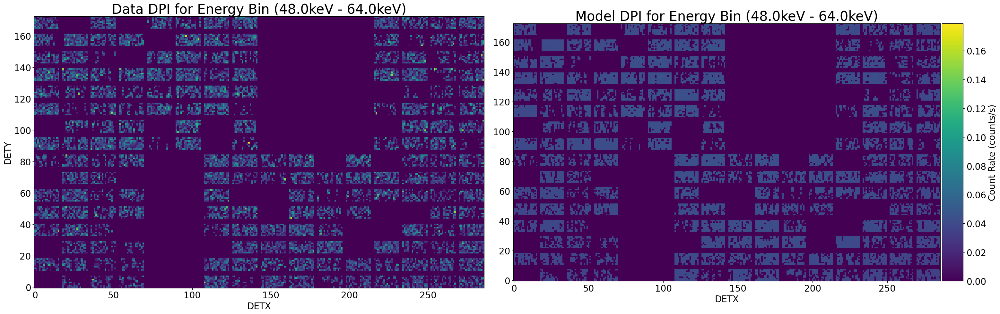

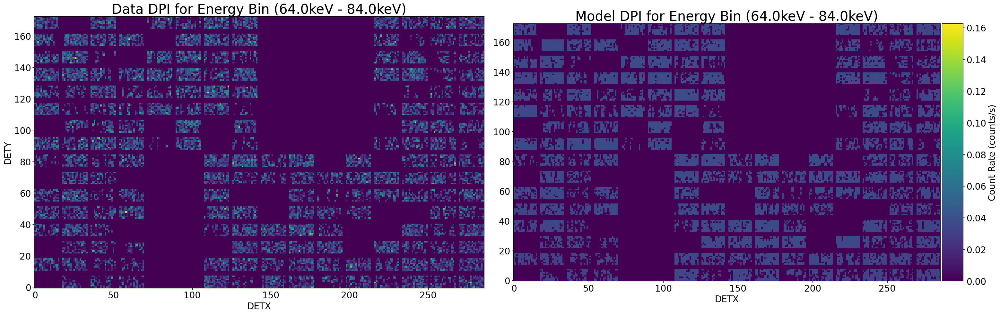

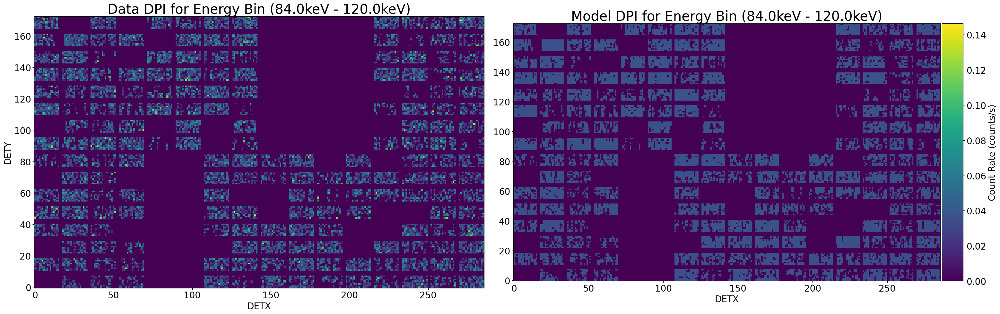

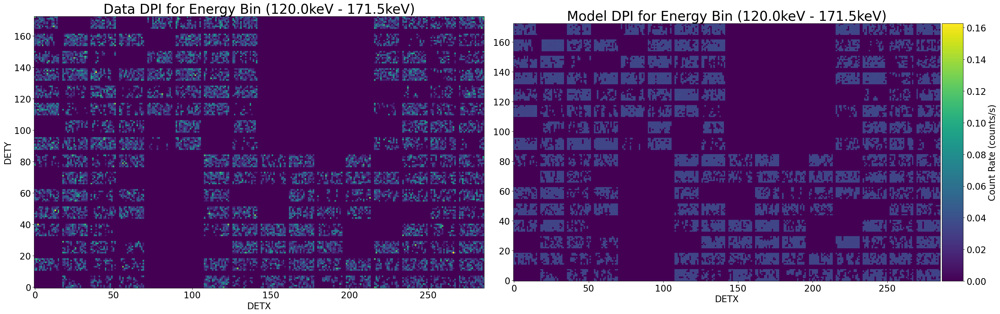

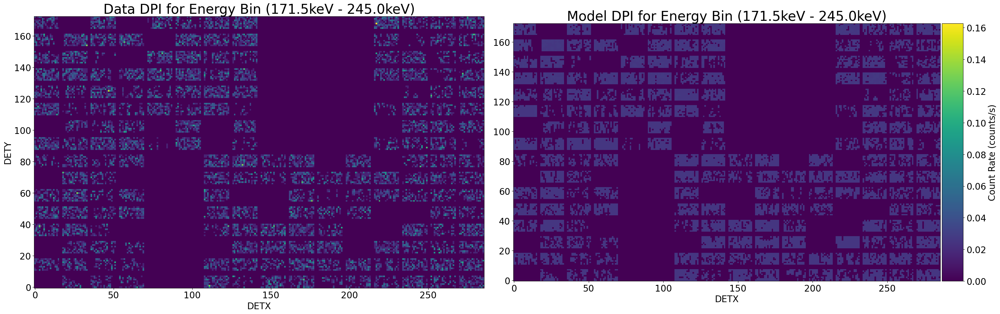

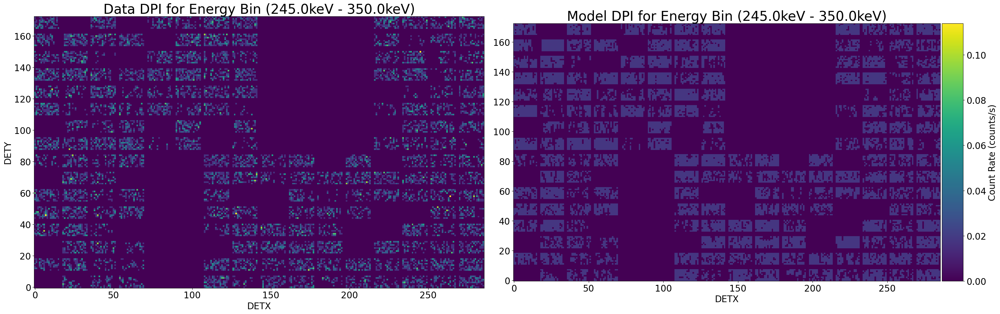

In [40]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib

for i in range(len(ebins0)):
    
    y1 = data_ebin_dpis[i]
    y2 = model_ebin_dpis[i]
    matplotlib.rc('xtick', labelsize=20) 
    matplotlib.rc('ytick', labelsize=20) 
    minmin = np.min([np.min(y1), np.min(y2)])
    maxmax = np.max([np.max(y1), np.max(y2)])

    fig, ax = plt.subplots(1,2, figsize=(30,10))
    fig.tight_layout()
    im1 = ax[0].imshow(y1,vmin=minmin, vmax=maxmax)
    im2 = ax[1].imshow(y2,vmin=minmin, vmax=maxmax)

    ax[0].invert_yaxis()
    ax[1].invert_yaxis()
    divider = make_axes_locatable(ax[1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    
    ax[0].set_xlabel('DETX',fontsize = 20)
    ax[0].set_ylabel('DETY',fontsize = 20)
    ax[1].set_xlabel('DETX',fontsize = 20)
    #ax[1].set_ylabel('DETY',fontsize = 20)

    ax[0].set_title("Data DPI for Energy Bin ({a}keV - {b}keV)".format(a=ebins0[i], b=ebins1[i]), fontsize=30)
    ax[1].set_title("Model DPI for Energy Bin ({a}keV - {b}keV)".format(a=ebins0[i], b=ebins1[i]), fontsize=30)
    
    cbar = fig.colorbar(im2, cax=cax, orientation='vertical')
    cbar.set_label('Count Rate (counts/s)', fontsize=20)

In the previous cell, we compare between the model and data dpis essentially by eye. We can actually quantify the difference between the model and data dpis on a per-pixel basis by creating a dpi of the absolute differences between the data and model count dpis. Note that in multiplying the rate dpis by the exposure, we get the expected number of counts for each detector. Thus, it is important to note that the values in the count dpi can be non-integer as the values reflect the expectated count number. The following plots show the absolute differences between model and data dpis for every energy bin. 

Data counts for energy bin 15.0keV - 24.0keV: 105950.0
Model counts for energy bin 15.0keV - 24.0keV: 107404.99909920308
Average absolute difference:  -0.1 for energy bin 15.0keV - 24.0keV
Variance of residuals =  9.24


Data counts for energy bin 24.0keV - 35.0keV: 65216.0
Model counts for energy bin 24.0keV - 35.0keV: 66180.06985220472
Average absolute difference:  -0.06 for energy bin 24.0keV - 35.0keV
Variance of residuals =  4.69


Data counts for energy bin 35.0keV - 48.0keV: 38279.0
Model counts for energy bin 35.0keV - 48.0keV: 38669.991772102614
Average absolute difference:  -0.03 for energy bin 35.0keV - 48.0keV
Variance of residuals =  2.63


Data counts for energy bin 48.0keV - 64.0keV: 37561.0
Model counts for energy bin 48.0keV - 64.0keV: 37805.037927961355
Average absolute difference:  -0.02 for energy bin 48.0keV - 64.0keV
Variance of residuals =  2.59


Data counts for energy bin 64.0keV - 84.0keV: 32714.0
Model counts for energy bin 64.0keV - 84.0keV: 32909.9432717595

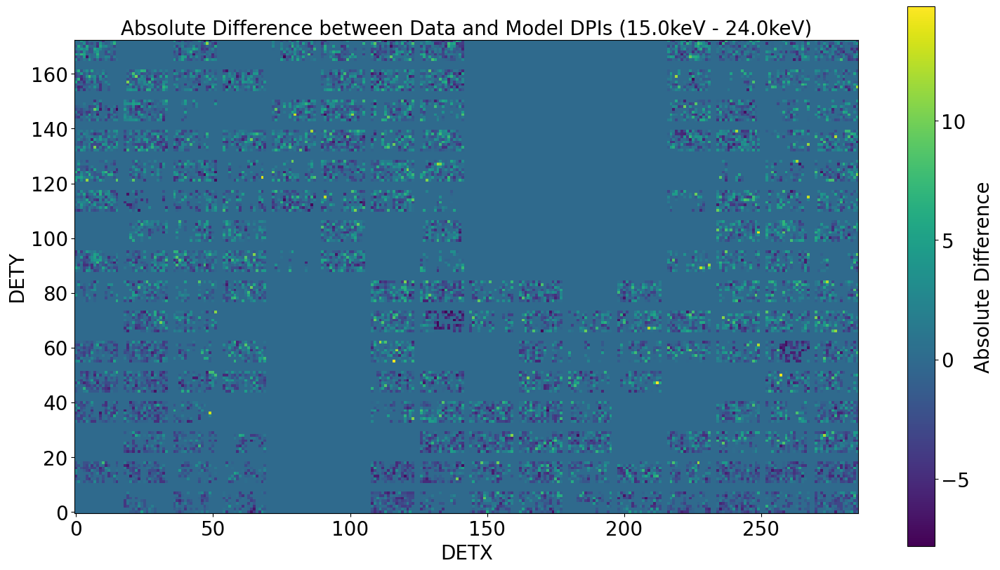

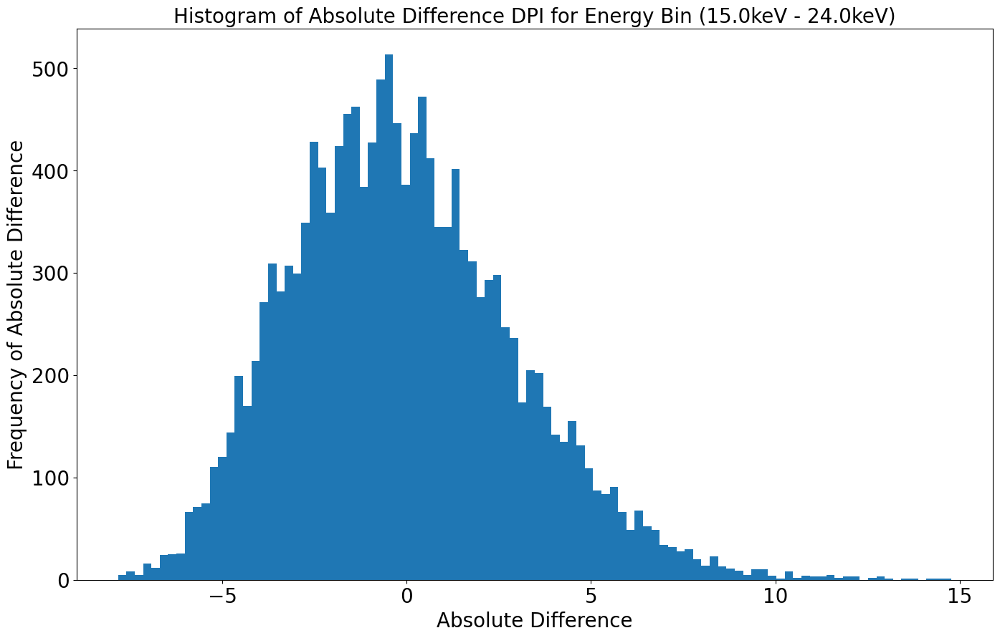

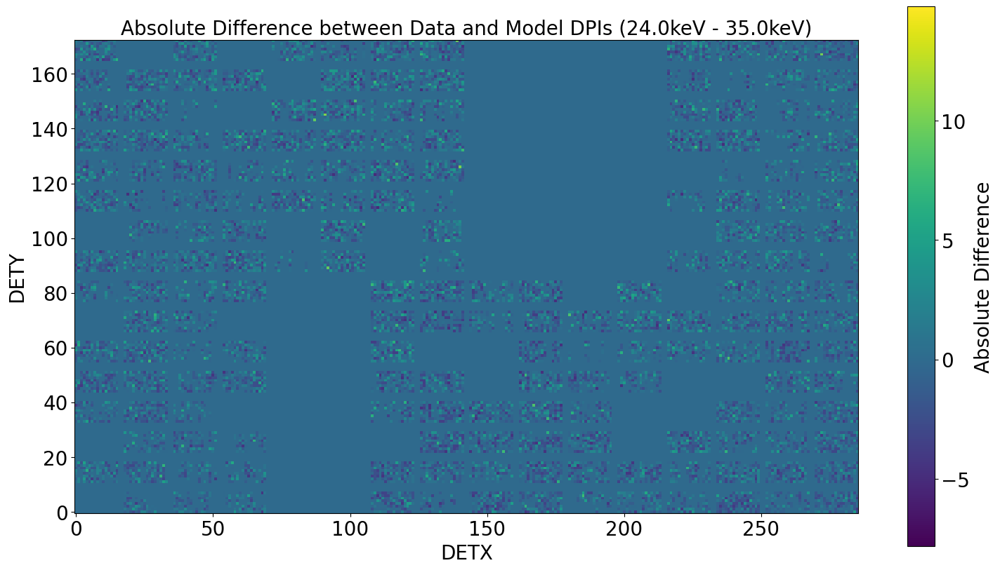

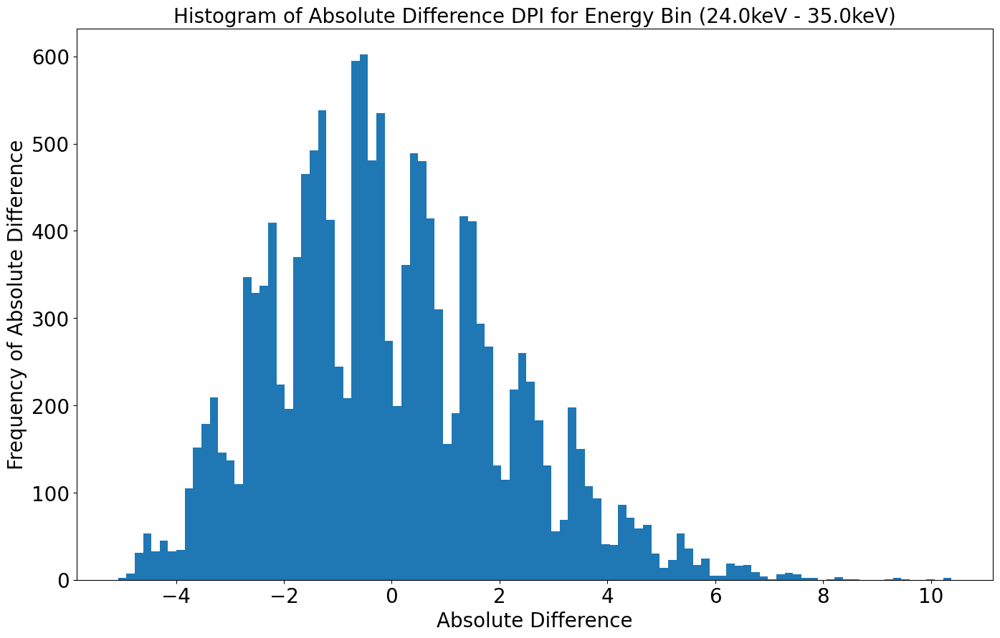

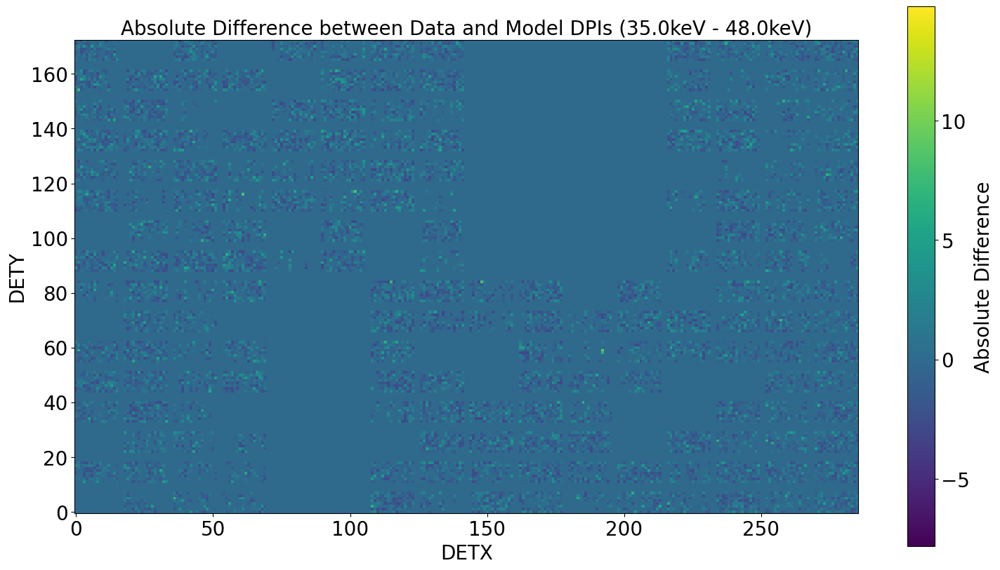

...

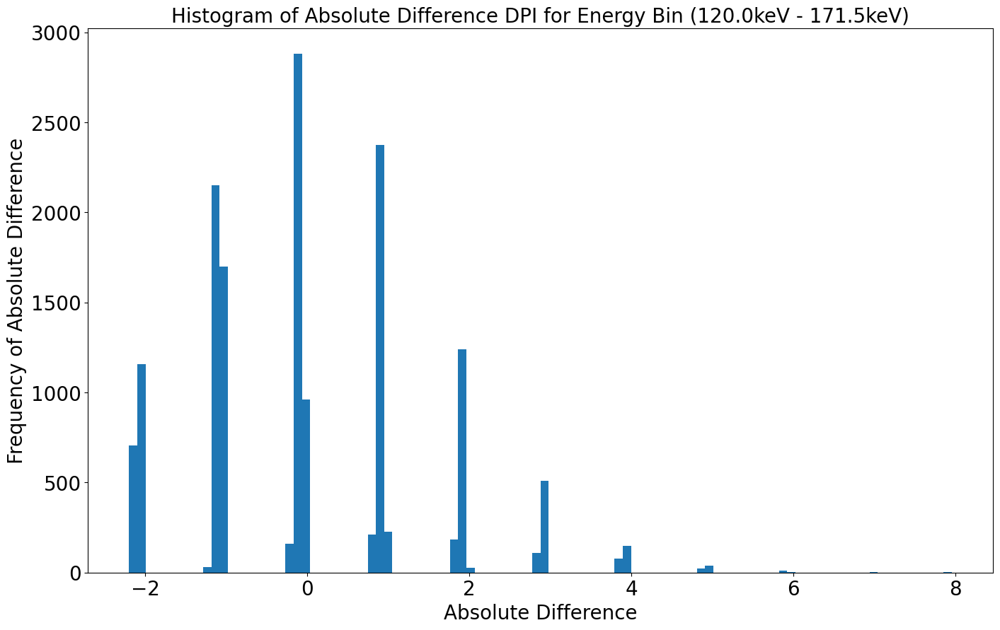

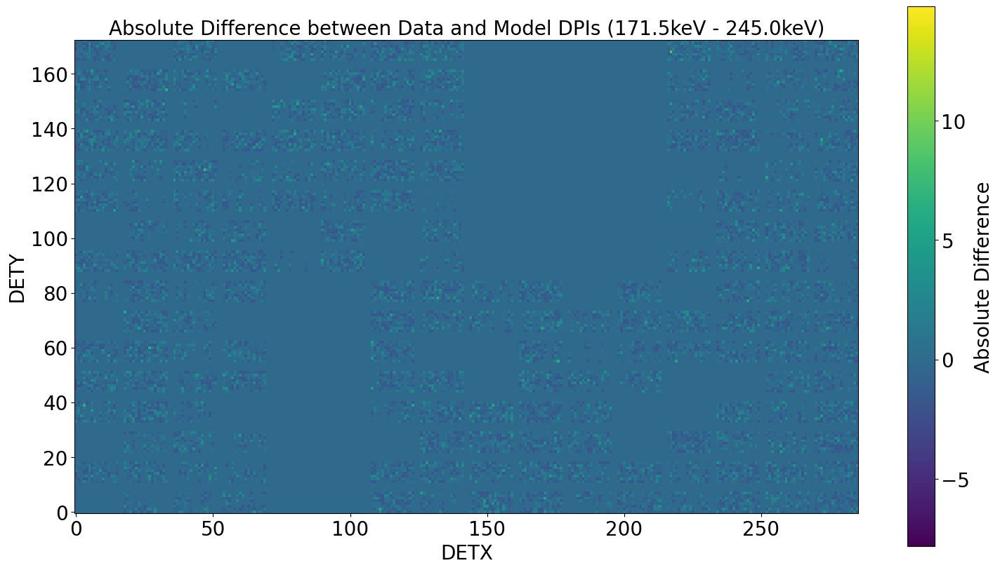

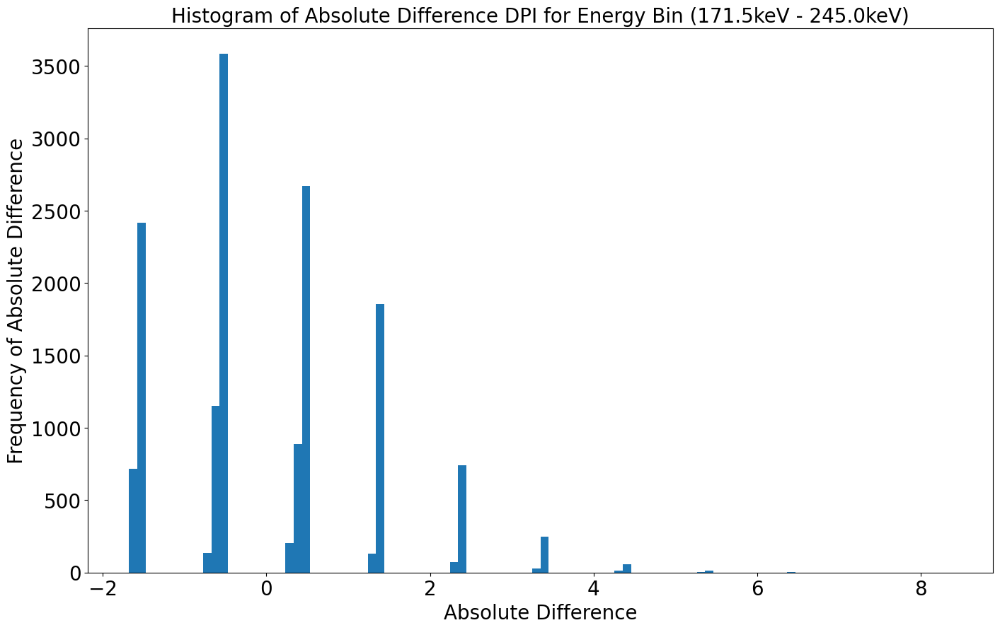

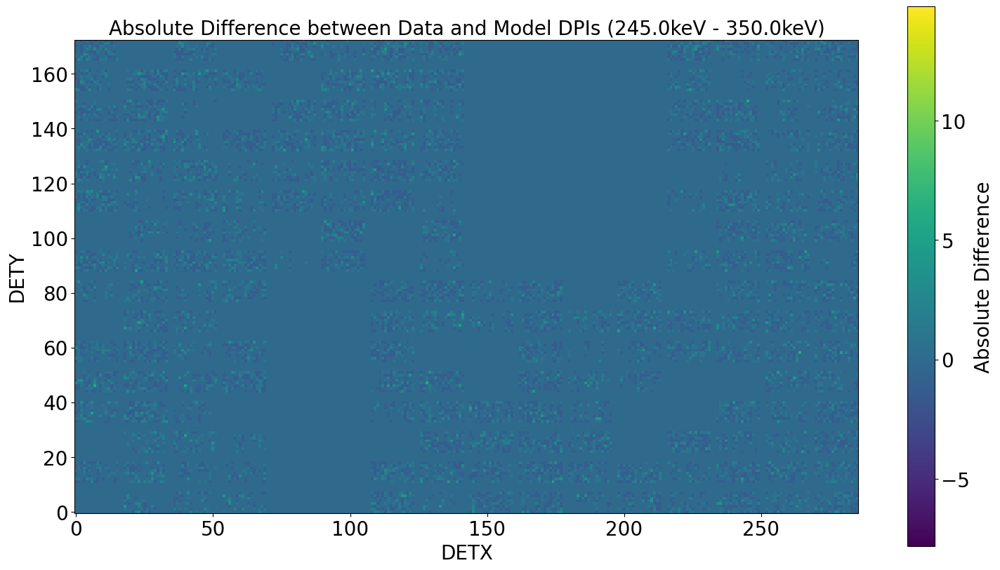

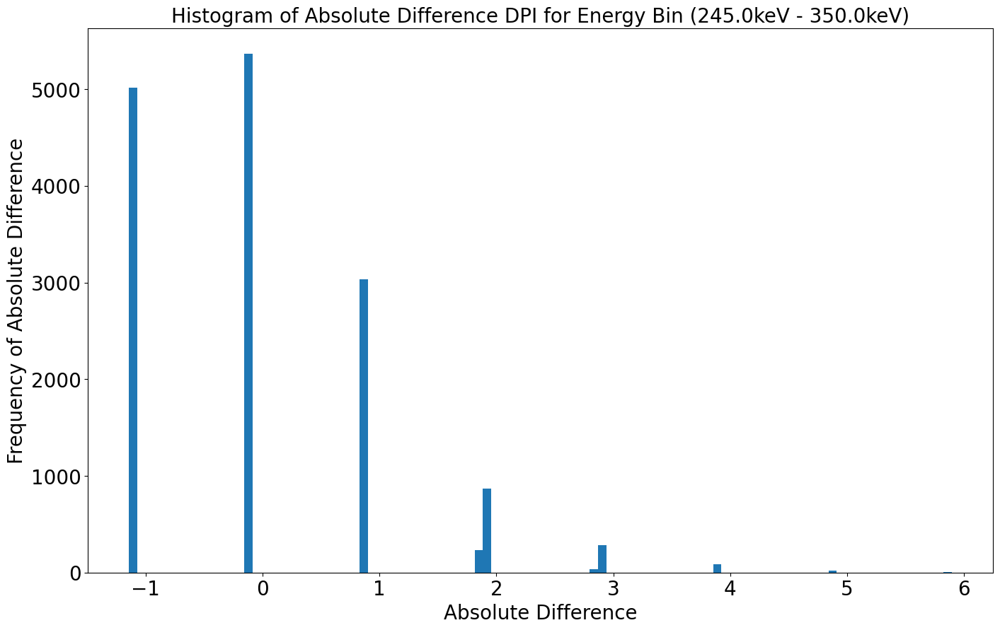

In [41]:
# Absolute Difference DPI
# abs(data-model)
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib

absolute_diff_dpis = []
absolute_diff_dpis_bl_dmask = []
total_count_data = 0.0
total_count_model = 0.0
minmin = 0.0
maxmax = 0.0

for i in range(len(ebins0)):

    # dpis for visualizing absolute difference dpi 
    y1 = exp*data_ebin_dpis[i]
    y2 = exp*model_ebin_dpis[i]
    
    # dpis for calculating average and histogram of just the absolute differences
    # between the detectors coded by bl_dmask
    y1_bl_dmask = y1[bl_dmask]
    y2_bl_dmask = y2[bl_dmask]
    
    # Calculating absolute difference dpi using y1 and y2
    absolute_diff = np.round(y1 - y2, 2)

    # updating the total count difference between the data and model
    count_data = np.sum(y1_bl_dmask)
    count_model = np.sum(y2_bl_dmask)
    print("Data counts for energy bin {a}keV - {b}keV: {c}".format(a = ebins0[i], b = ebins1[i], c = count_data))
    print("Model counts for energy bin {a}keV - {b}keV: {c}".format(a = ebins0[i], b = ebins1[i], c = count_model))
    total_count_data += count_data
    total_count_model += count_model

    # Calculating absolutely difference dpi using y1_bl_dmask and y2_bl_dmask
    absolute_diff_bl_dmask = y1_bl_dmask - y2_bl_dmask
    
    # To check that the number of detectors in the dpi above is the same as the number of good detectors,
    # uncomment the following line.
    #print("size of absolute_diff_bl_dmask: ", len(absolute_diff_bl_dmask))
    average_count_diff = round(np.average(absolute_diff_bl_dmask), 2)
    print("Average absolute difference: ", average_count_diff, "for energy bin {a}keV - {b}keV".format(a = ebins0[i], b = ebins1[i]))
    print("Variance of residuals = ", round(np.var(absolute_diff_bl_dmask), 2))

    print("\n")

    # Calculating the max and min values for the absolute difference for later use
    # when creating a colorbar for the dpi plots
    current_min = np.amin(absolute_diff)
    current_max = np.amax(absolute_diff)
    if(minmin > current_min):
        minmin = current_min
    if(maxmax < current_max):
        maxmax = current_max

    absolute_diff_dpis.append(absolute_diff)
    absolute_diff_dpis_bl_dmask.append(absolute_diff_bl_dmask)

for i in range(len(ebins0)):
    dpi = absolute_diff_dpis[i]
    dpi_bl_dmask = absolute_diff_dpis_bl_dmask[i]
    
    # Visualizing the absolute difference dpi
    fig = plt.figure(figsize=(18, 10))
    plt.imshow(dpi, vmin=minmin, vmax=maxmax)
    plt.title("Absolute Difference between Data and Model DPIs ({a}keV - {b}keV)".format(a=ebins0[i], b=ebins1[i]), fontsize=20)
    plt.xlabel("DETX",fontsize=20)
    plt.ylabel("DETY",fontsize=20)
    ax = plt.gca()
    ax.invert_yaxis()
    cbar = plt.colorbar()
    cbar.set_label('Absolute Difference', fontsize=20)

    # Visualizing the histogram of absolute differences for coded detectors
    fig = plt.figure(figsize=(16.5, 10))
    hist, bins  = np.histogram(dpi_bl_dmask, bins=100)
    plt.hist(bins[:-1], bins, weights=hist)
    plt.title("Histogram of Absolute Difference DPI for Energy Bin ({a}keV - {b}keV)".format(a=ebins0[i], b=ebins1[i]), fontsize=20)
    plt.xlabel("Absolute Difference",fontsize=20)
    plt.ylabel("Frequency of Absolute Difference",fontsize=20)

print("Total Count for Data DPI: ", total_count_data)
print("Total Count for Model DPI: ", total_count_model)


Next, we display the model and data rate dpis for the low (<=64keV) and high (>64keV) energies. 

In [42]:
model_low_high_dpis = model_low_and_high_energy_dpi(rate_dpis, dmask, 9, 4)
low_energy_best_fit_data = best_fit_data[best_fit_data['ENERGY'] <= 64]
high_energy_best_fit_data = best_fit_data[np.logical_and(best_fit_data['ENERGY'] > 64, best_fit_data['ENERGY'] < 350)]
data_low_high_dpis = []

xbins = np.arange(286+1) - 0.5
ybins = np.arange(173+1) - 0.5
A, xedges, yedges = np.histogram2d(low_energy_best_fit_data['DETX'], low_energy_best_fit_data['DETY'], bins=[xbins,ybins])
A_normed = A/exp
data_low_high_dpis.append(np.transpose(A_normed))

xbins = np.arange(286+1) - 0.5
ybins = np.arange(173+1) - 0.5
A, xedges, yedges = np.histogram2d(high_energy_best_fit_data['DETX'], high_energy_best_fit_data['DETY'], bins=[xbins,ybins])
A_normed = A/exp
data_low_high_dpis.append(np.transpose(A_normed))

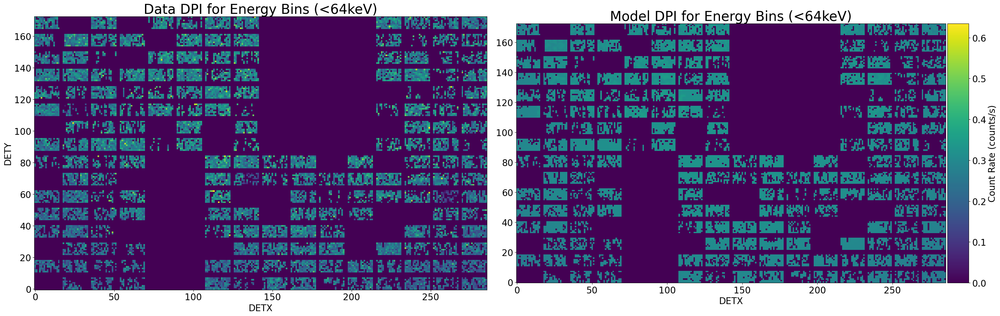

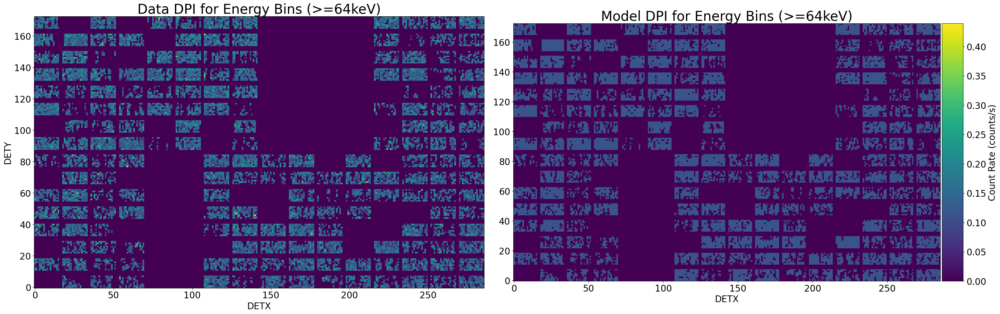

In [43]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib

for i in range(len(data_low_high_dpis)):
    
    y1 = data_low_high_dpis[i]
    y2 = model_low_high_dpis[i]

    matplotlib.rc('xtick', labelsize=20) 
    matplotlib.rc('ytick', labelsize=20) 
    minmin = np.min([np.min(y1), np.min(y2)])
    maxmax = np.max([np.max(y1), np.max(y2)])

    fig, ax = plt.subplots(1,2, figsize=(30,10))
    fig.tight_layout()
    im1 = ax[0].imshow(y1,vmin=minmin, vmax=maxmax)
    im2 = ax[1].imshow(y2,vmin=minmin, vmax=maxmax)

    ax[0].invert_yaxis()
    ax[1].invert_yaxis()
    divider = make_axes_locatable(ax[1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    
    ax[0].set_xlabel('DETX',fontsize = 20)
    ax[0].set_ylabel('DETY',fontsize = 20)
    ax[1].set_xlabel('DETX',fontsize = 20)
    #ax[1].set_ylabel('DETY',fontsize = 20)

    if i == 0:
        ax[0].set_title("Data DPI for Energy Bins (<64keV)", fontsize=30)
        ax[1].set_title("Model DPI for Energy Bins (<64keV)", fontsize=30)
    elif i == 1:
        ax[0].set_title("Data DPI for Energy Bins (>=64keV)", fontsize=30)
        ax[1].set_title("Model DPI for Energy Bins (>=64keV)", fontsize=30)
    
    cbar = fig.colorbar(im2, cax=cax, orientation='vertical')
    cbar.set_label('Count Rate (counts/s)', fontsize=20)


We also show the absolute differences between the low and high energy dpis. 

Average absolute difference <64keV:  -2.19
Variance of residuals =  21.51


Average absolute difference >=64keV:  2.19
Variance of residuals =  9.76




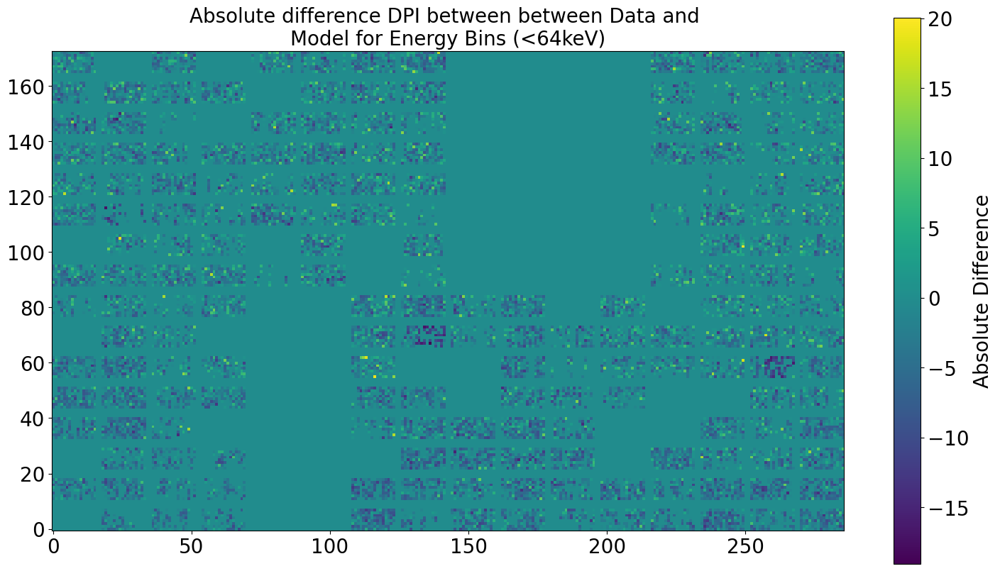

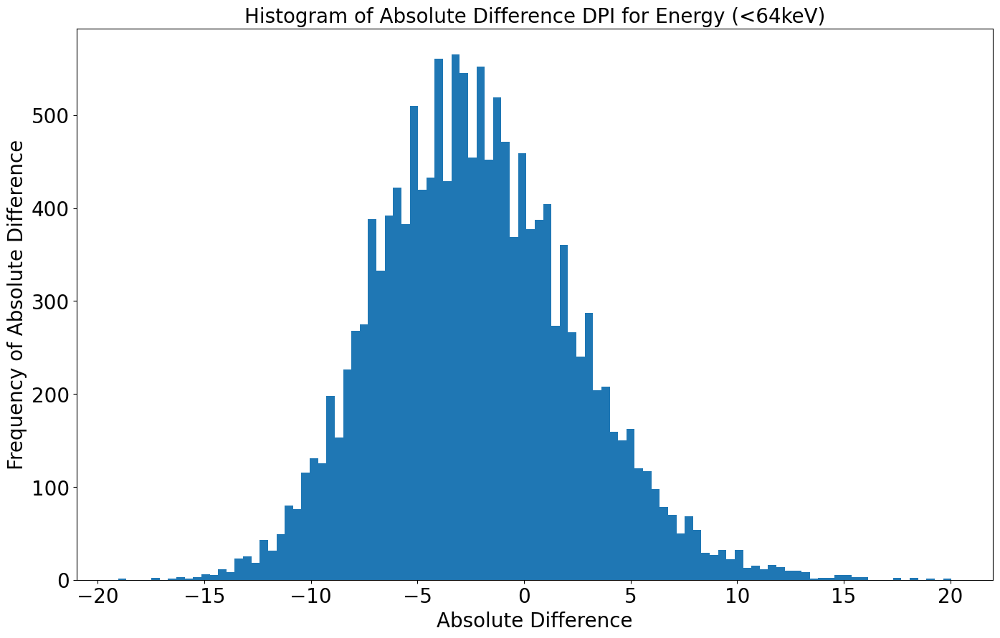

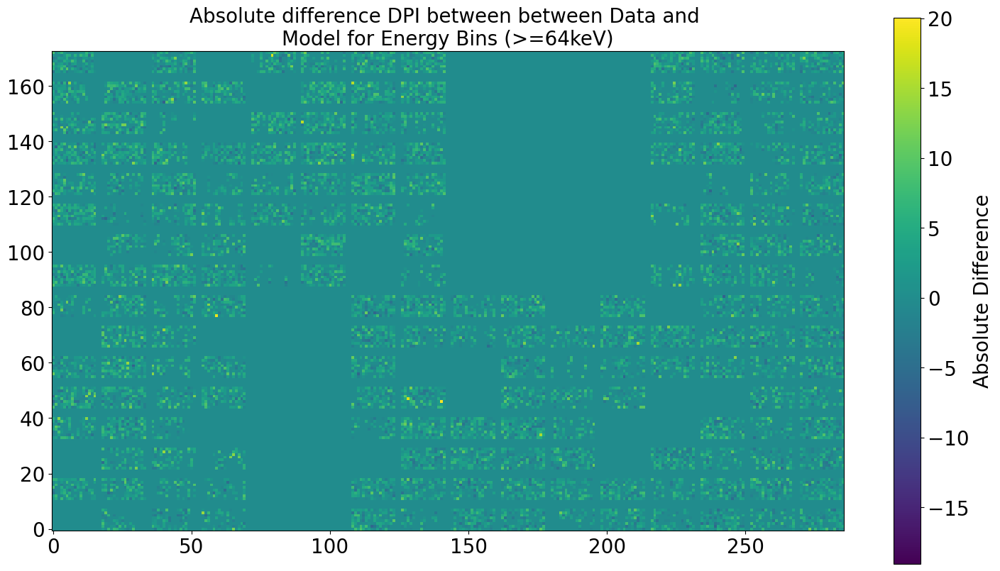

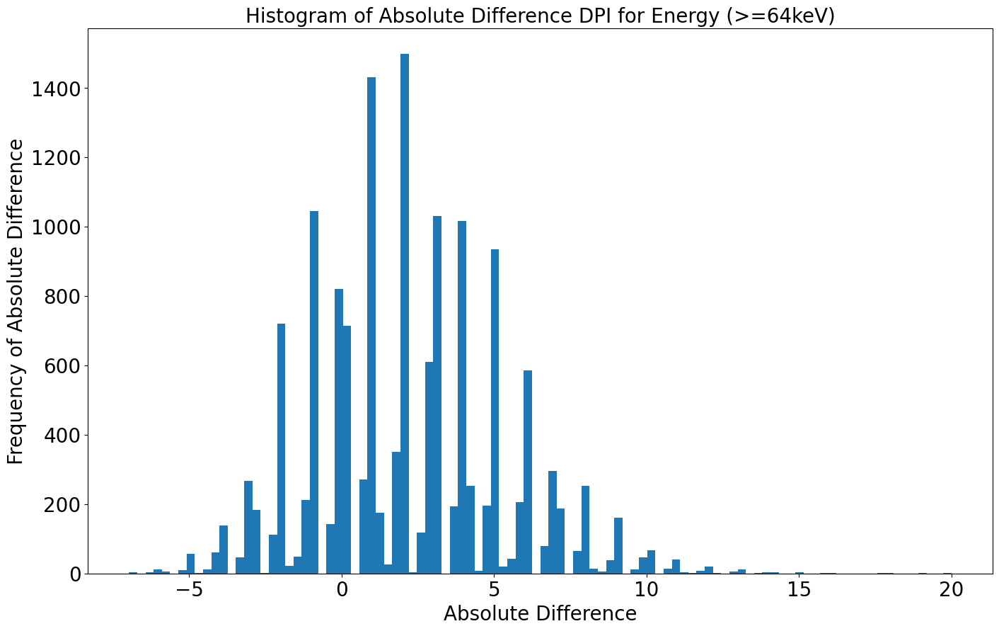

In [44]:
# Absolute Difference DPI
# abs(data-model)
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib

absolute_diff_dpis = []
absolute_diff_dpis_bl_dmask = []

minmin = 0.0
maxmax = 0.0


for i in range(len(data_low_high_dpis)):
    
    y1 = exp*data_low_high_dpis[i]
    y2 = exp*model_low_high_dpis[i]

    y1_bl_dmask = y1[bl_dmask]
    y2_bl_dmask = y2[bl_dmask]

    absolute_diff = y1 - y2
    
    absolute_diff_bl_dmask = y1_bl_dmask - y2_bl_dmask

    current_min = np.amin(absolute_diff)
    current_max = np.amax(absolute_diff)
    if(minmin > current_min):
        minmin = current_min
    if(maxmax < current_max):
        maxmax = current_max

    if i == 0:
        print("Average absolute difference <64keV: ", round(np.average(absolute_diff_bl_dmask), 2))
        print("Variance of residuals = ", round(np.var(absolute_diff_bl_dmask), 2))
        print('\n')
    elif i == 1:
        print("Average absolute difference >=64keV: ", round(np.average(absolute_diff_bl_dmask), 2))
        print("Variance of residuals = ", round(np.var(absolute_diff_bl_dmask), 2))
        print('\n')
        
    absolute_diff_dpis.append(absolute_diff)
    absolute_diff_dpis_bl_dmask.append(absolute_diff_bl_dmask)

for i in range(len(data_low_high_dpis)):
    dpi = absolute_diff_dpis[i]
    dpi_bl_dmask = absolute_diff_dpis_bl_dmask[i]
    
    fig = plt.figure(figsize=(18, 10))
    plt.imshow(dpi, vmin=minmin, vmax=maxmax)
    if i == 0:
        plt.title("Absolute difference DPI between between Data and \nModel for Energy Bins (<64keV)", fontsize=20)
    elif i == 1:
        plt.title("Absolute difference DPI between between Data and \nModel for Energy Bins (>=64keV)", fontsize=20)
    ax = plt.gca()
    ax.invert_yaxis()
    cbar = plt.colorbar()
    cbar.set_label('Absolute Difference', fontsize=20)


    fig = plt.figure(figsize=(16.5, 10))
    hist, bins  = np.histogram(dpi_bl_dmask, bins=100)
    plt.hist(bins[:-1], bins, weights=hist)

    if i == 0:
        plt.title("Histogram of Absolute Difference DPI for Energy (<64keV)", fontsize=20)
    elif i == 1:
        plt.title("Histogram of Absolute Difference DPI for Energy (>=64keV)", fontsize=20)
        
    plt.xlabel("Absolute Difference",fontsize=20)
    plt.ylabel("Frequency of Absolute Difference",fontsize=20)

--- 
## **Comparing the Best Background Fit (All Sources) to Data During Background Fit Time Window**
---

In the previous model vs data analysis, we were using a model that assumed the presence of only one point source within the FOV of BAT. This was chosen to speed up the calculation of the background model parameters. As a result, the model calculated does not fit the full background with the 7 point sources shown in cell 26 which would impact our model vs data analysis. We'll repeat the previous analysis using the background fit already calculated and saved into 'bkg_estimation.csv'.

In the following cell we import the completed analysis from 'bkg_estimation.csv'. From the completed background analysis, it was found that only 4 of the 7 point sources within the BAT FOV were significantly detected. These sources are printed below along with the background fit parameters. The remaining point sources were discarded in the fitting process described above, after cell 30. 

In [45]:
from nitrates.llh_analysis import parse_bkg_csv

bkg_fname = os.path.join(work_dir,'bkg_estimation.csv')
bkg_df, bkg_name, PSnames, bkg_mod, ps_mods = parse_bkg_csv(bkg_fname, solid_angle_dpi,\
                    ebins0, ebins1, bl_dmask, rt_dir)
bkg_mod.has_deriv = False
bkg_mod_list = [bkg_mod]
Nsrcs = len(ps_mods)
if Nsrcs > 0:
    bkg_mod_list += ps_mods
    for ps_mod in ps_mods:
        ps_mod.has_deriv = False
    bkg_mod = CompoundModel(bkg_mod_list)
bkg_mod

tmid = trigtime
bkg_row = bkg_df.iloc[np.argmin(np.abs(tmid - bkg_df['time']))]
bkg_params = {pname:bkg_row[pname] for pname in\
            bkg_mod.param_names}
bkg_name = bkg_mod.name
bkg_params

['4U 1700-377', 'GRO J1655-40', 'GX 339-4', 'Sco X-1']


{'Background_bkg_rate_0': 0.0913703220701183,
 'Background_bkg_rate_1': 0.0661578002239374,
 'Background_bkg_rate_2': 0.0400898569026105,
 'Background_bkg_rate_3': 0.0394919934207801,
 'Background_bkg_rate_4': 0.0346780266835281,
 'Background_bkg_rate_5': 0.0351076584048365,
 'Background_bkg_rate_6': 0.033602492003955,
 'Background_bkg_rate_7': 0.0248610826847874,
 'Background_bkg_rate_8': 0.0176399476145076,
 'Background_flat_0': 0.0,
 'Background_flat_1': 0.0,
 'Background_flat_2': 0.1859632649428977,
 'Background_flat_3': 0.0766344244533236,
 'Background_flat_4': 0.3020855890115875,
 'Background_flat_5': 0.7611510180823338,
 'Background_flat_6': 0.8091430254293075,
 'Background_flat_7': 1.0,
 'Background_flat_8': 1.0,
 '4U 1700-377_imx': -0.0981485305770971,
 '4U 1700-377_imy': -0.4742076074486664,
 '4U 1700-377_rate_0': 0.0124901359218975,
 '4U 1700-377_rate_1': 0.0072425264886238,
 '4U 1700-377_rate_2': 0.0045295645864628,
 '4U 1700-377_rate_3': 0.0016876913514016,
 '4U 1700-377_r

In [46]:
rate_dpis = bkg_mod.get_rate_dpis(bkg_params)
model_ebin_dpis = model_ebin_dpi(rate_dpis, dmask, 9)
model_low_high_dpis = model_low_and_high_energy_dpi(rate_dpis, dmask, 9, 4)

We'll streamline the process of creating the absolute difference dpis with the following function.

In [47]:
def create_absolute_diff_dpis(data_ebin_dpis, model_ebin_dpis, nebins):
    
    absolute_diff_dpis = []
    absolute_diff_dpis_bl_dmask = []
    total_count_data = 0.0
    total_count_model = 0.0
    minmin = 0.0
    maxmax = 0.0

    for i in range(nebins):

        # dpis for visualizing absolute difference dpi 
        y1 = exp*data_ebin_dpis[i]
        y2 = exp*model_ebin_dpis[i]
        
        # dpis for calculating average and histogram of just the absolute differences
        # between the detectors coded by bl_dmask
        y1_bl_dmask = y1[bl_dmask]
        y2_bl_dmask = y2[bl_dmask]
        
        # Calculating absolute difference dpi using y1 and y2
        absolute_diff = y1 - y2

        # updating the total count difference between the data and model
        count_data = np.sum(y1_bl_dmask)
        count_model = np.sum(y2_bl_dmask)
        print("Data counts for energy bin {a}keV - {b}keV: {c}".format(a = ebins0[i], b = ebins1[i], c = count_data))
        print("Model counts for energy bin {a}keV - {b}keV: {c}".format(a = ebins0[i], b = ebins1[i], c = count_model))
        total_count_data += count_data
        total_count_model += count_model
        
        # Calculating absolutely difference dpi using y1_bl_dmask and y2_bl_dmask
        absolute_diff_bl_dmask = y1_bl_dmask - y2_bl_dmask
        
        # To check that the number of detectors in the dpi above is the same as the number of good detectors,
        # uncomment the following line.
        #print("size of absolute_diff_bl_dmask: ", len(absolute_diff_bl_dmask))
        average_count_diff = round(np.average(absolute_diff_bl_dmask), 2)
        print("Average absolute difference: ", average_count_diff, "for energy bin {a}keV - {b}keV".format(a = ebins0[i], b = ebins1[i]))
        print("Variance of residuals = ", round(np.var(absolute_diff_bl_dmask),2))
        print("\n")

        # Calculating the max and min values for the absolute difference for later use
        # when creating a colorbar for the dpi plots
        current_min = np.amin(absolute_diff)
        current_max = np.amax(absolute_diff)
        if(minmin > current_min):
            minmin = current_min
        if(maxmax < current_max):
            maxmax = current_max

        absolute_diff_dpis.append(absolute_diff)
        absolute_diff_dpis_bl_dmask.append(absolute_diff_bl_dmask)

    # Plotting absolute difference DPI and histogram
    for i in range(len(ebins0)):
        dpi = absolute_diff_dpis[i]
        dpi_bl_dmask = absolute_diff_dpis_bl_dmask[i]
        
        # Visualizing the absolute difference dpi
        fig = plt.figure(figsize=(18, 10))
        plt.imshow(dpi, vmin=minmin, vmax=maxmax)
        plt.title("Absolute Difference between Data and \nbkg_estimation.csv Model DPIs ({a}keV - {b}keV)".format(a=ebins0[i], b=ebins1[i]), fontsize=20)
        plt.xlabel("DETX",fontsize=20)
        plt.ylabel("DETY",fontsize=20)
        ax = plt.gca()
        ax.invert_yaxis()
        cbar = plt.colorbar()
        cbar.set_label('Absolute Difference', fontsize=20)

        # Visualizing the histogram of absolute differences for coded detectors
        fig = plt.figure(figsize=(16.5, 10))
        hist, bins  = np.histogram(dpi_bl_dmask, bins=100)
        plt.hist(bins[:-1], bins, weights=hist)
        plt.title("Histogram of Absolute Difference DPI for Energy Bin ({a}keV - {b}keV)".format(a=ebins0[i], b=ebins1[i]), fontsize=20)
        plt.xlabel("Absolute Difference",fontsize=20)
        plt.ylabel("Frequency of Absolute Difference",fontsize=20)

    print("\n")
    print("Total Count for Data DPI: ", total_count_data)
    print("Total Count for bkg_estimation.csv Model DPI: ", total_count_model)

Calling the function results in the following plots below displaying the absolute difference dpi and histogram for each energy bin.

Data counts for energy bin 15.0keV - 24.0keV: 105950.0
Model counts for energy bin 15.0keV - 24.0keV: 107144.03190977531
Average absolute difference:  -0.08 for energy bin 15.0keV - 24.0keV
Variance of residuals =  7.91


Data counts for energy bin 24.0keV - 35.0keV: 65216.0
Model counts for energy bin 24.0keV - 35.0keV: 65686.18093409299
Average absolute difference:  -0.03 for energy bin 24.0keV - 35.0keV
Variance of residuals =  4.64


Data counts for energy bin 35.0keV - 48.0keV: 38279.0
Model counts for energy bin 35.0keV - 48.0keV: 38262.9704310057
Average absolute difference:  0.0 for energy bin 35.0keV - 48.0keV
Variance of residuals =  2.62


Data counts for energy bin 48.0keV - 64.0keV: 37561.0
Model counts for energy bin 48.0keV - 64.0keV: 37394.907598767335
Average absolute difference:  0.01 for energy bin 48.0keV - 64.0keV
Variance of residuals =  2.58


Data counts for energy bin 64.0keV - 84.0keV: 32714.0
Model counts for energy bin 64.0keV - 84.0keV: 32506.279510287306
A

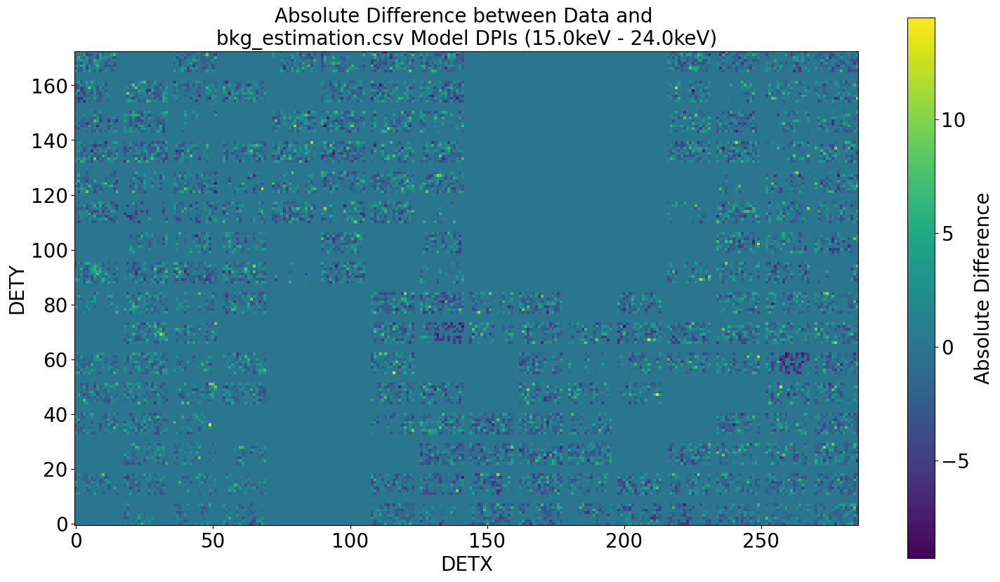

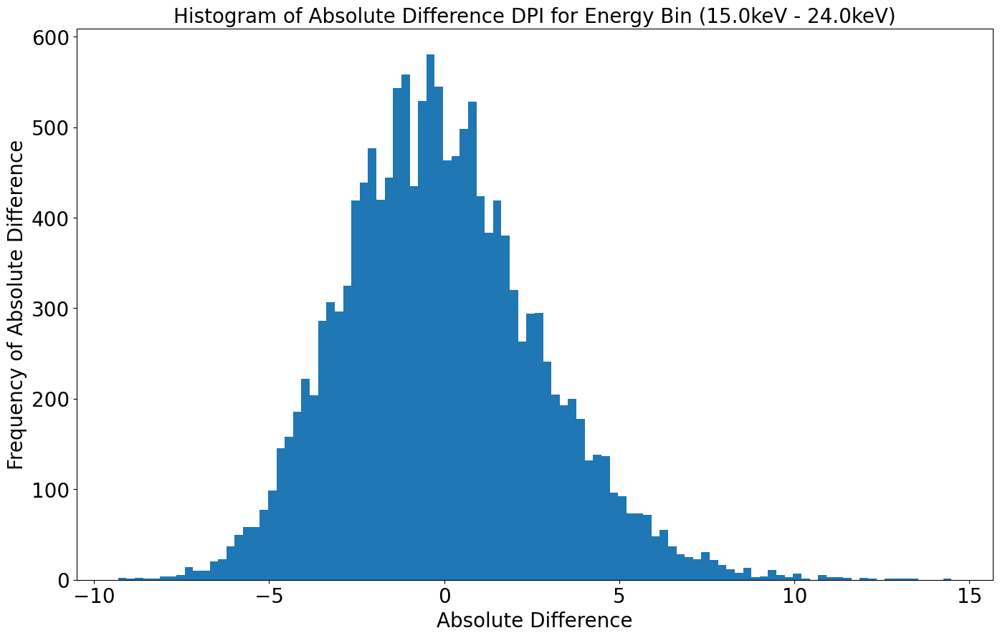

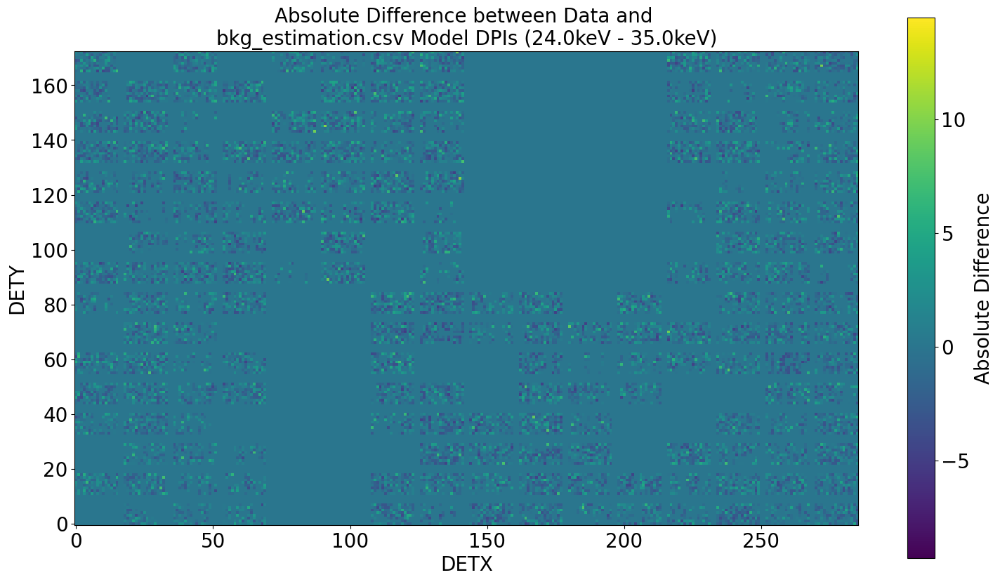

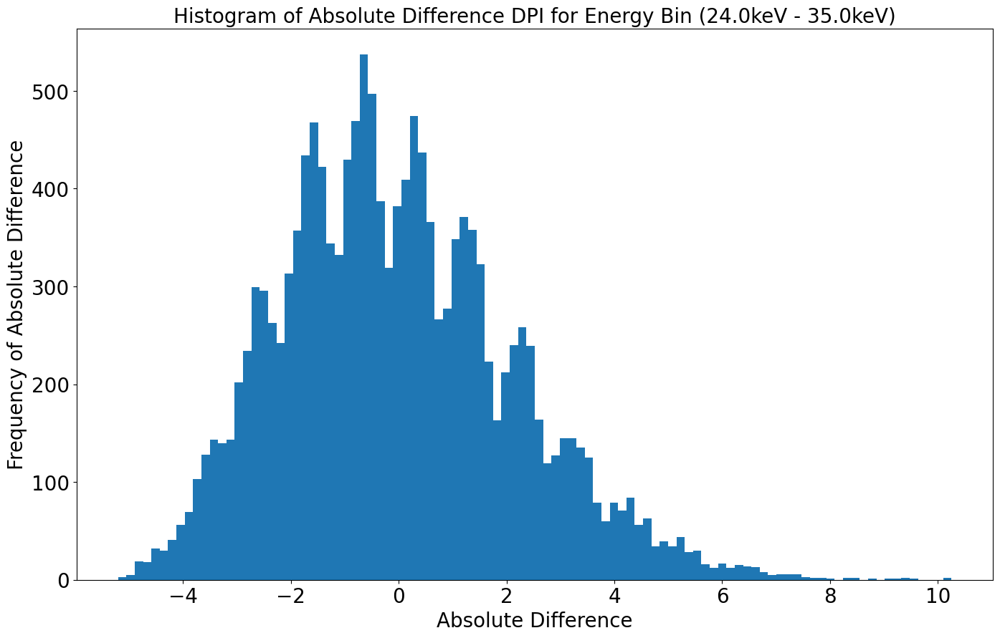

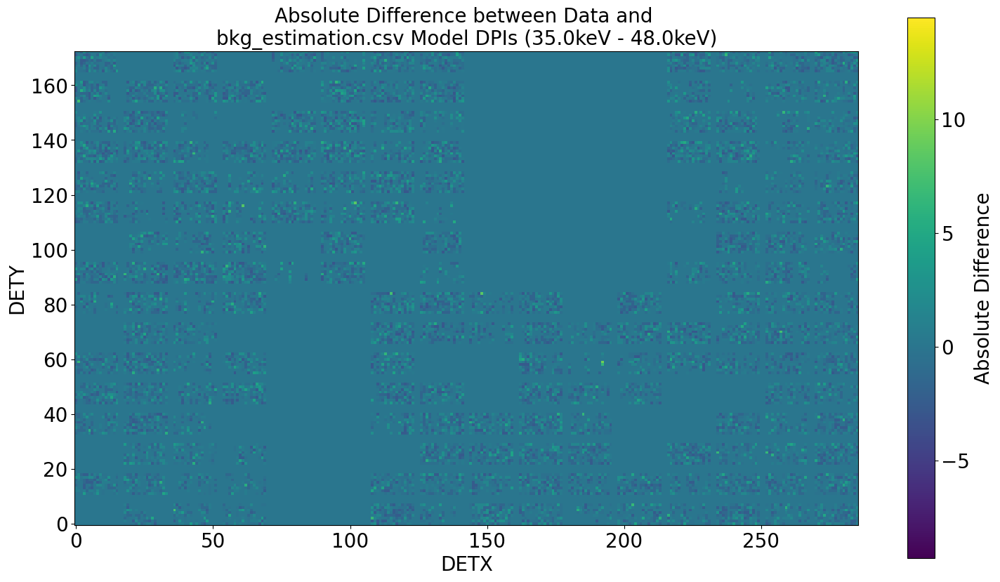

...

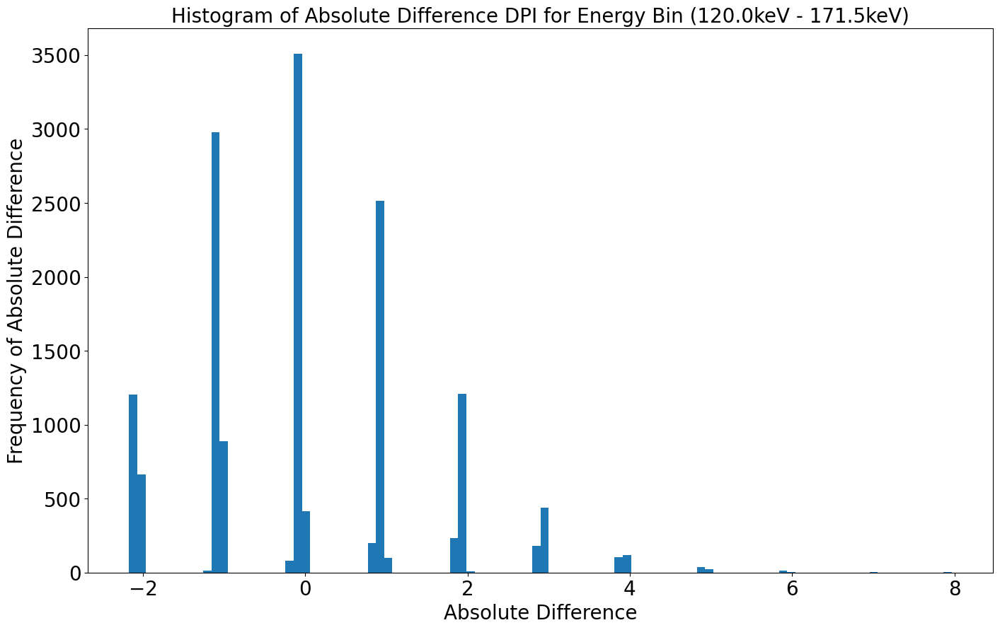

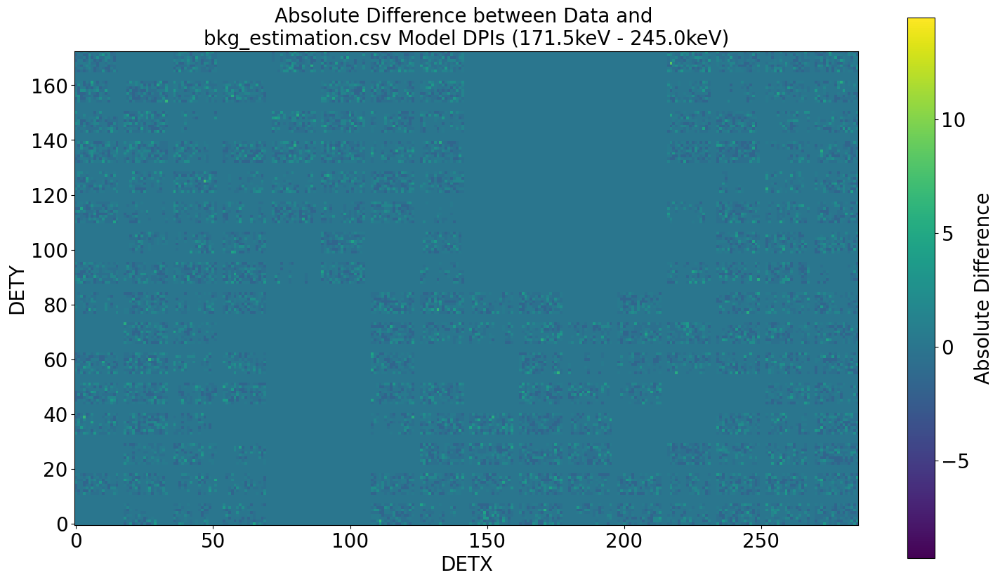

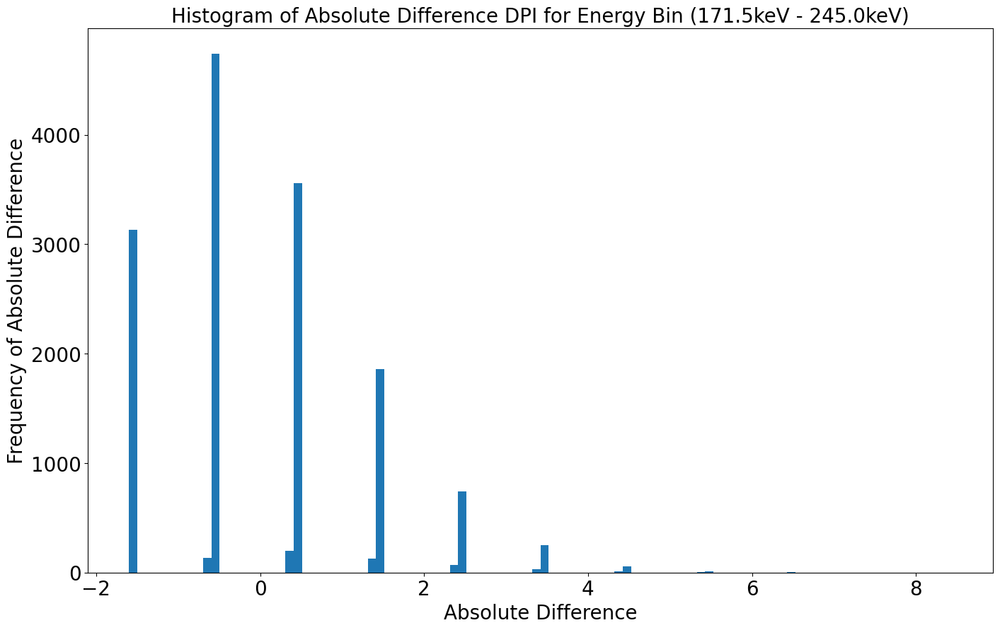

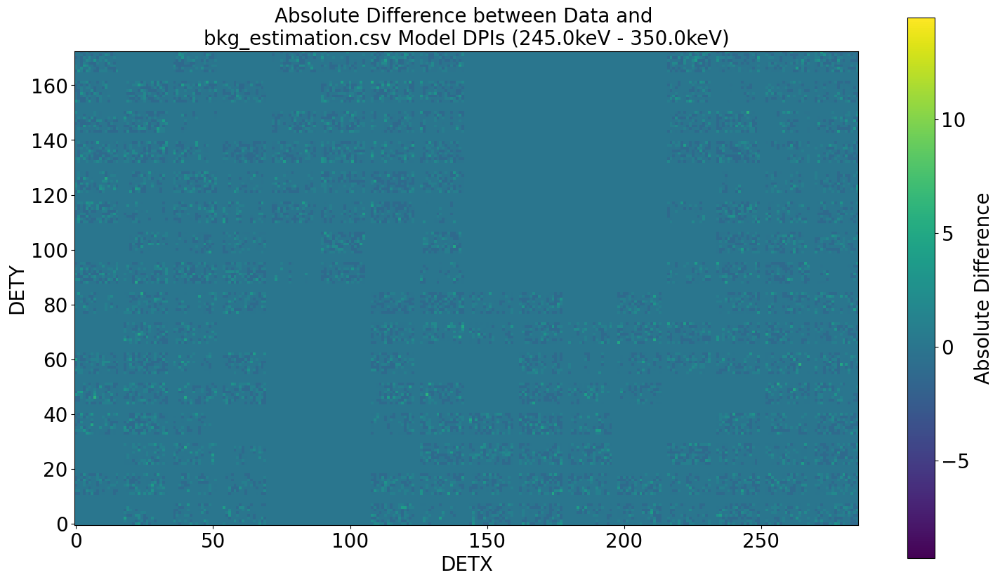

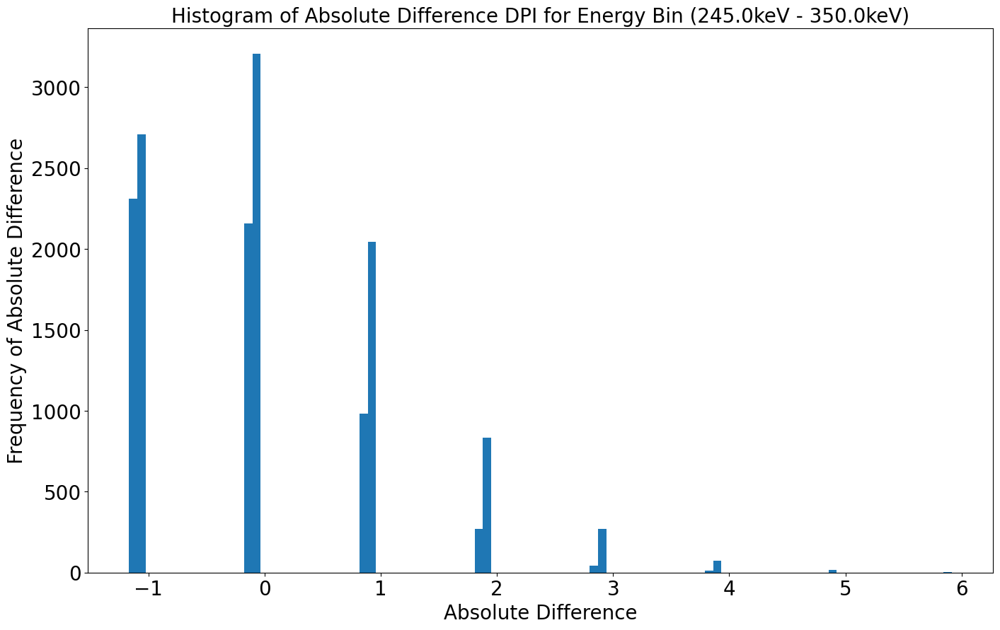

In [48]:
create_absolute_diff_dpis(data_ebin_dpis, model_ebin_dpis, len(ebins0))

Average absolute difference <64keV:  -2.06
Variance of residuals =  19.43
Average absolute difference >=64keV:  2.28
Variance of residuals =  9.75


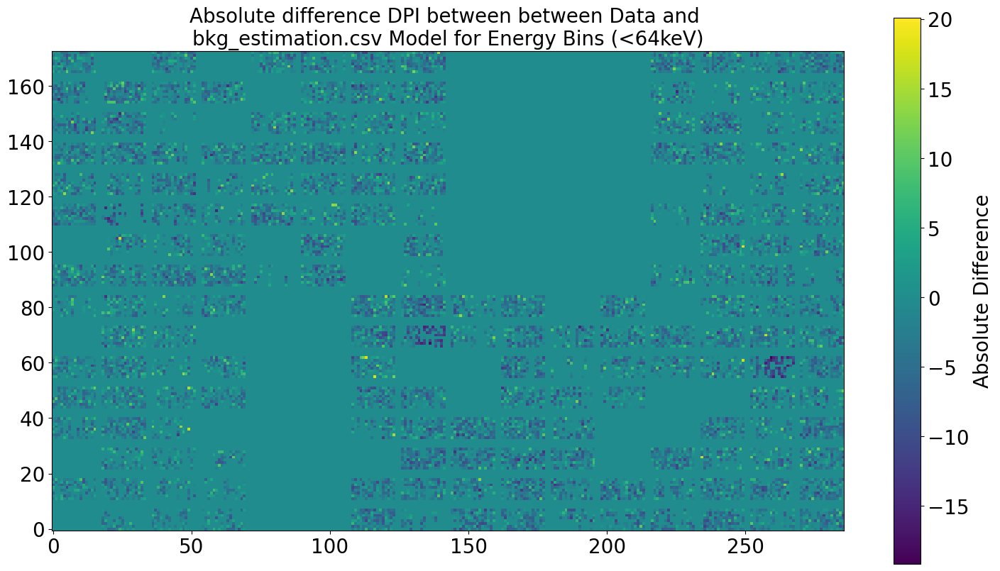

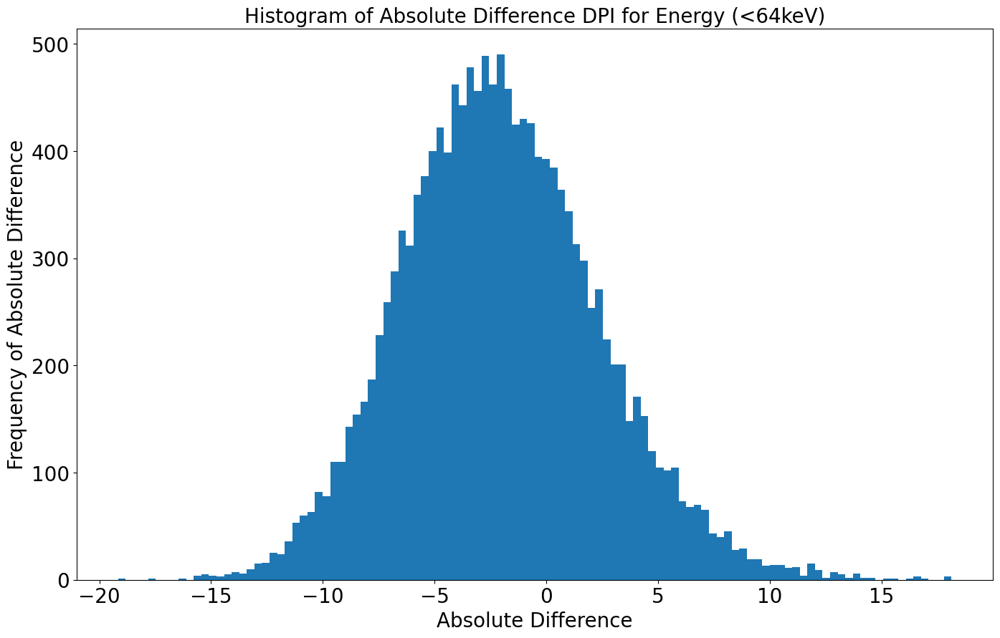

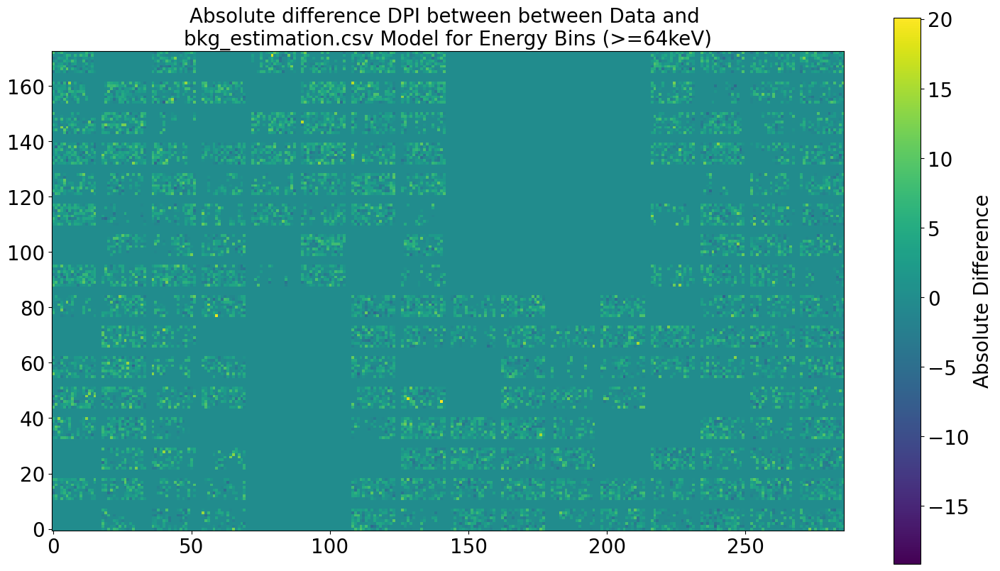

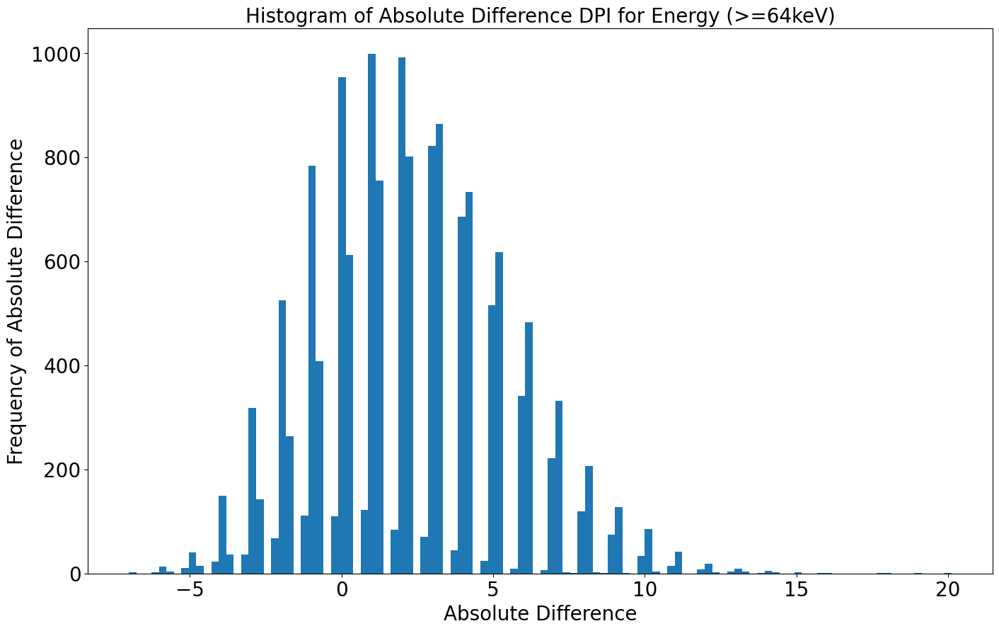

In [49]:
# Absolute Difference DPI
# abs(data-model)
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib

absolute_diff_dpis = []
absolute_diff_dpis_bl_dmask = []

minmin = 0.0
maxmax = 0.0


for i in range(len(data_low_high_dpis)):
    
    y1 = exp*data_low_high_dpis[i]
    y2 = exp*model_low_high_dpis[i]

    y1_bl_dmask = y1[bl_dmask]
    y2_bl_dmask = y2[bl_dmask]

    absolute_diff = y1 - y2
    absolute_diff_bl_dmask = y1_bl_dmask - y2_bl_dmask

    current_min = np.amin(absolute_diff)
    current_max = np.amax(absolute_diff)
    if(minmin > current_min):
        minmin = current_min
    if(maxmax < current_max):
        maxmax = current_max

    if i == 0:
        print("Average absolute difference <64keV: ", round(np.average(absolute_diff_bl_dmask),2))
        print("Variance of residuals = ", round(np.var(absolute_diff_bl_dmask),2))
    elif i == 1:
        print("Average absolute difference >=64keV: ", round(np.average(absolute_diff_bl_dmask),2))
        print("Variance of residuals = ", round(np.var(absolute_diff_bl_dmask),2))
    absolute_diff_dpis.append(absolute_diff)
    absolute_diff_dpis_bl_dmask.append(absolute_diff_bl_dmask)

for i in range(len(data_low_high_dpis)):
    dpi = absolute_diff_dpis[i]
    dpi_bl_dmask = absolute_diff_dpis_bl_dmask[i]
    
    fig = plt.figure(figsize=(18, 10))
    plt.imshow(dpi, vmin=minmin, vmax=maxmax)
    if i == 0:
        plt.title("Absolute difference DPI between between Data and \nbkg_estimation.csv Model for Energy Bins (<64keV)", fontsize=20)
    elif i == 1:
        plt.title("Absolute difference DPI between between Data and \nbkg_estimation.csv Model for Energy Bins (>=64keV)", fontsize=20)

    ax = plt.gca()
    ax.invert_yaxis()
    cbar = plt.colorbar()
    cbar.set_label('Absolute Difference', fontsize=20)


    fig = plt.figure(figsize=(16.5, 10))
    hist, bins  = np.histogram(dpi_bl_dmask, bins=110)
    plt.hist(bins[:-1], bins, weights=hist)

    if i == 0:
        plt.title("Histogram of Absolute Difference DPI for Energy (<64keV)", fontsize=20)
    elif i == 1:
        plt.title("Histogram of Absolute Difference DPI for Energy (>=64keV)", fontsize=20)
        
    plt.xlabel("Absolute Difference",fontsize=20)
    plt.ylabel("Frequency of Absolute Difference",fontsize=20)